# Figure 3a - Learning M

updated: May 18, 2022

In order to optimize learning in a supervised setting, a learner's credit assignment mapping could improve over time to align more closely with the decoder (Fig.3A). To investigate the effect of such learning in our model, we applied our analysis to an RNN in which recurrent weights $\mathbf{W}^{\mathrm{rec}}$ were trained with SL, with a biased credit assignment mapping $\mathbf{M}$ that slowly improved via _weight mirroring_, a perturbation-based algorithm for learning a backward-pass credit assignment matrix {akrout2019deep,lansdell2019learning}. 

In our simulations (Fig.3B), the alignment between $\mathbf{M}$ and $(\mathbf{W}^{\mathrm{bmi1}})^\top$ is initially set at $0.5$, then slowly increases as $\mathbf{M}$ is learned simultaneously along with the recurrent weights $\mathbf{W}^{\mathrm{rec}}$. Instead of predicting the change in flow field before and after learning, we now apply our analysis over discrete windows during learning. As expected, activity changes are biased---and hence t
he SL and RL learning rules are distinguishable---early in learning. However, these differences disappear as $\mathbf{M}$ approaches $(\mathbf{W}^{\mathrm{bmi}1})^\top$ later in learning. 

The figure generated for the submission (Figure 3):

<img src="submission-figures-2022-5-19/fig3-2022-5-23.jpg" width=600 height=400 />


The stats are saved in `experiments/NeurIPS-2022-5-16/figs-2022-5-19/stats_rflo_weightmirror5-19-v1.pickle`

The simulations are plotted in `experiments/NeurIPS-2022-5-16/figs-2022-5-19/rflo-weight-mirror.pdf`

This file is located here: `rnn-learning/experiments/NeurIPS-2022-5-16/Fig3a-LearnM-2022-5-19.ipynb`

Here are the hyperparameters used for this simulation. Note that I have decreased the learning rate for the recurrent weights slightly, although this is not strictly necessary:

And here is the experimental setup. Note that `w_out1` is chosen to have an overlap of 0.4 with `w_out0`, and then `w_m` is selected to have an overlap of 0.4 with `w_out1` (this relationship between `w_m` and `w_out1` is |what matters most for learning)

Then, allow `w_m` to change via weight mirroring:

Some interesting points to note:

* early in learning, the metric calculation holds for small windows even though the task hasn't been fully learned

* later in learning, the metric no longer holds for small windows. I suspect it is because we are in an "overtrained" regime where weight updates are just fitting to noise

In [20]:
folder = 'figs-2022-5-23/'

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator,FixedFormatter
import matplotlib.pylab as pylab

# analysis
from sklearn.decomposition import PCA, FactorAnalysis
from sklearn.linear_model import LinearRegression
from scipy import interpolate # don't import stats
from scipy import linalg as LA
from scipy.ndimage.filters import uniform_filter1d

# miscellaneous
from tqdm import tqdm
from itertools import cycle
from copy import deepcopy
import pickle

import logging
import warnings
import dataclasses
from dataclasses import dataclass
from typing import Optional, List

import sys
sys.path.append("../..")

In [6]:
from rnn import RNNparams, RNN
from task import Task
from simulation import Simulation
from algorithms.bptt import BPTT
from algorithms.rflo import RFLO
from algorithms.reinforce import REINFORCE
from algorithms.track_vars import TrackVars
from algorithms.weight_mirror import WeightMirror

from utils.plotting import plot_trained_trajectories, paper_format
from utils.metric import cos_sim, return_norm_and_angle
from utils.functions import choose_aligned_matrix

from utils.metric import cos_sim, flow_field_data, flow_field_predicted, calculate_flow_field_correlation


In [19]:
trial_duration = 20
n_in=4
frac_on = 0.2

x_tonic = 0.0*np.ones((trial_duration, n_in)) # shape 20 x 4 i.e. time x channel
x_pulse1 = x_tonic.copy()
x_pulse2 = x_tonic.copy()
x_pulse3 = x_tonic.copy()
x_pulse4 = x_tonic.copy()
x_pulse1[0:int(trial_duration*frac_on),0] = 1
x_pulse2[0:int(trial_duration*frac_on),1] = 1
x_pulse3[0:int(trial_duration*frac_on),2] = 1
x_pulse4[0:int(trial_duration*frac_on),3] = 1

task1 = Task(x_in=x_pulse1,y_target=np.asarray([[1],[1]]))
task2 = Task(x_in=x_pulse2,y_target=np.asarray([[-1],[1]]))
task3 = Task(x_in=x_pulse3,y_target=np.asarray([[1],[-1]]))
task4 = Task(x_in=x_pulse4,y_target=np.asarray([[-1],[-1]]))

# Part 1 - RFLO across multiple seeds, Scenarios where M is learned

4it [00:00, 38.07it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.05
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: 0.001
sig_m: 0.1
lam_m: 1e-05
rng: <mtrand.RandomState object at 0x7fdd219636c0>


2500it [00:24, 100.97it/s]
11it [00:00, 104.13it/s]

M norm: 1.13	 M angle: 0.41, 34 iterations
w_out1 norm: 1.59	 w_out vs. w_out1 angle: 0.40
w_m norm: 1.13	 w_out1 vs. w_m angle: 0.41
w_m norm: 1.76	 w_out vs. w_m angle: 0.19start 0 end 800 


200it [00:01, 123.32it/s]
2it [00:00, 19.60it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 91.46it/s]
200it [00:01, 126.39it/s]


AR early fit 0.920, late fit 0.927


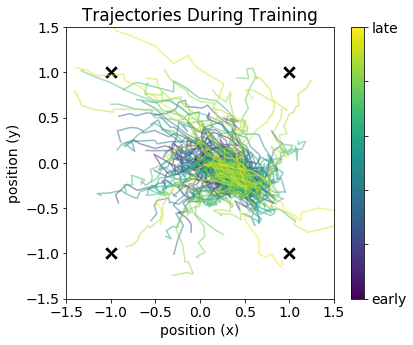

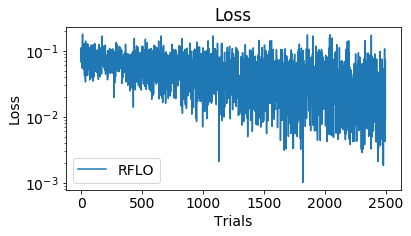

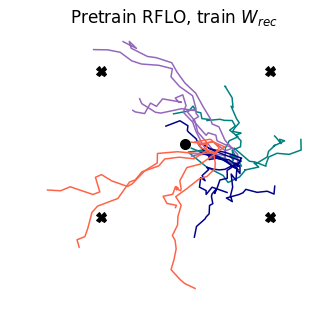

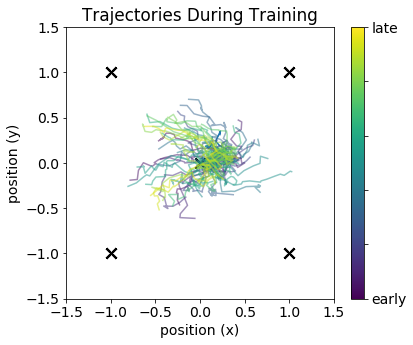

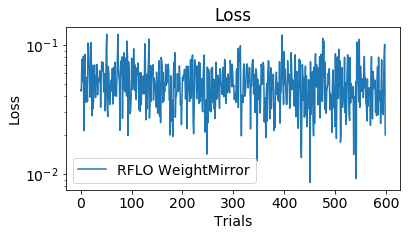

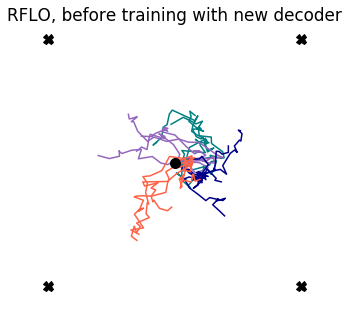

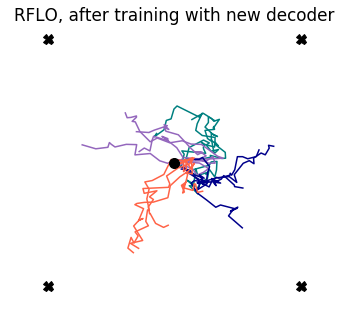

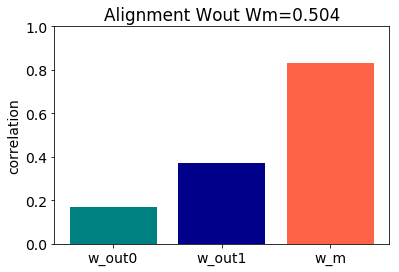

12it [00:00, 117.93it/s]

start 200 end 1000 


200it [00:01, 120.33it/s]
7it [00:00, 69.65it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 91.61it/s]
200it [00:01, 124.92it/s]


AR early fit 0.927, late fit 0.936


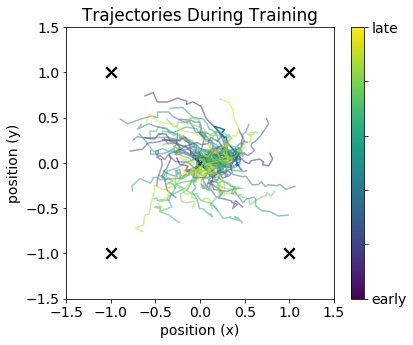

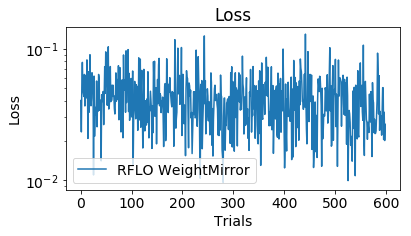

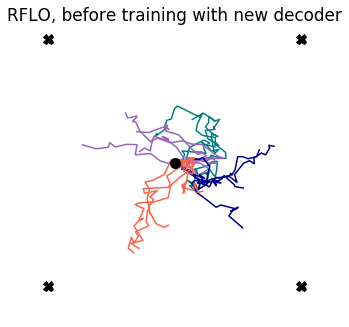

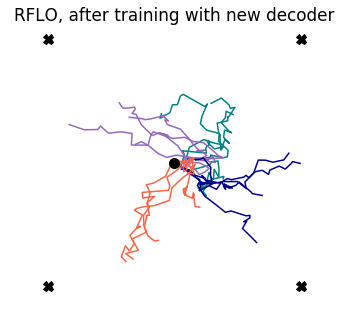

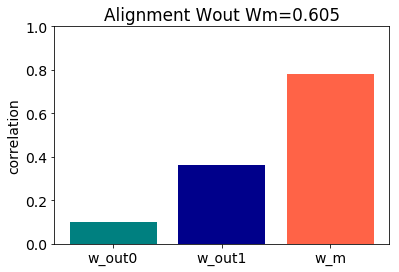

12it [00:00, 117.41it/s]

start 400 end 1200 


200it [00:01, 125.70it/s]
9it [00:00, 83.01it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 93.99it/s]
200it [00:01, 126.18it/s]


AR early fit 0.936, late fit 0.944


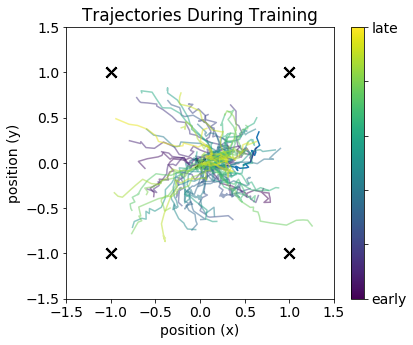

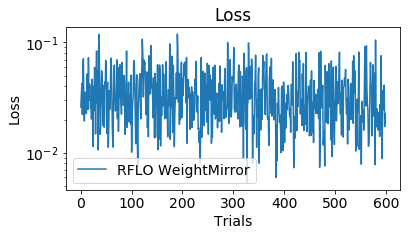

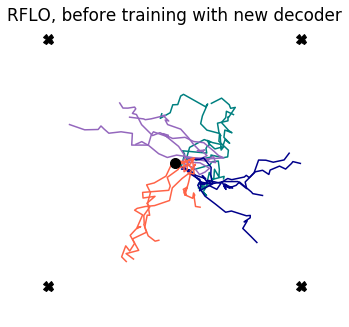

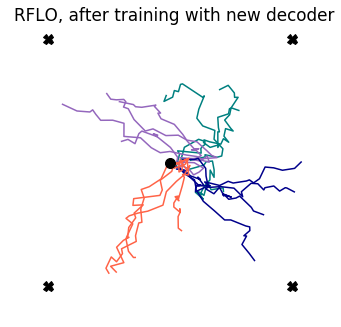

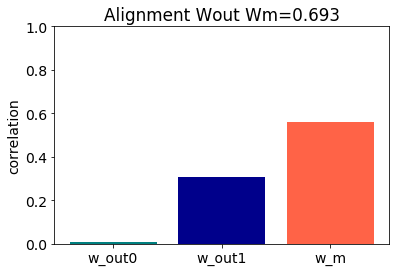

13it [00:00, 125.81it/s]

start 600 end 1400 


200it [00:01, 111.09it/s]
9it [00:00, 82.62it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 88.87it/s]
200it [00:01, 118.02it/s]


AR early fit 0.944, late fit 0.950


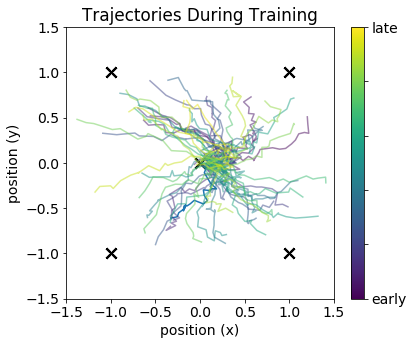

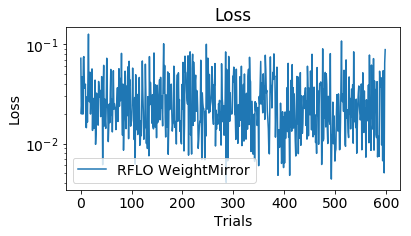

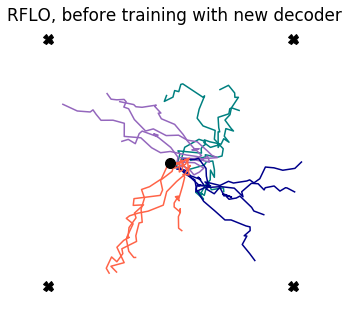

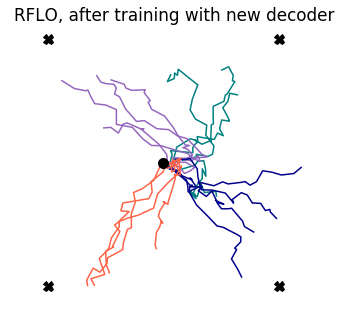

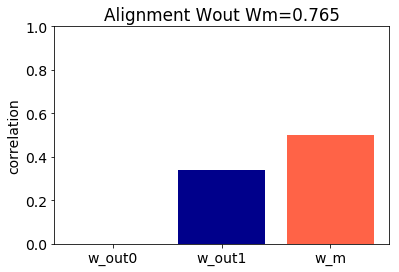

12it [00:00, 118.33it/s]

start 800 end 1600 


200it [00:01, 124.84it/s]
8it [00:00, 76.84it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 90.60it/s]
200it [00:01, 122.34it/s]


AR early fit 0.950, late fit 0.955


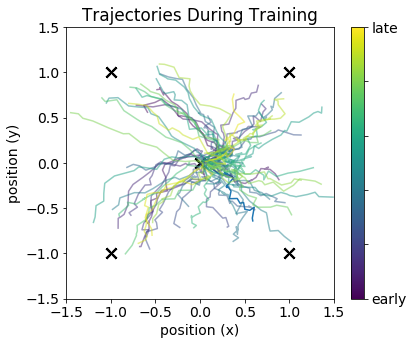

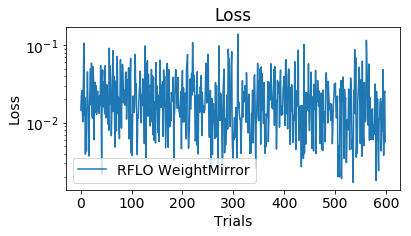

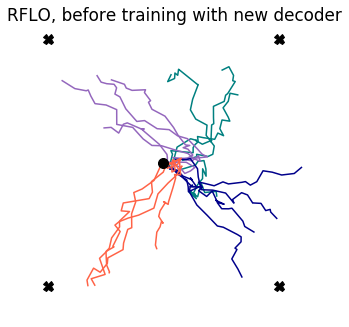

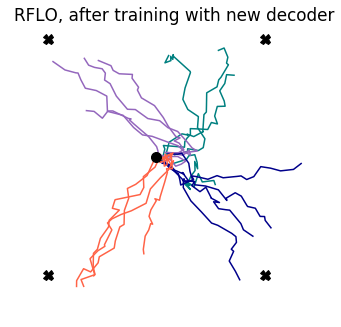

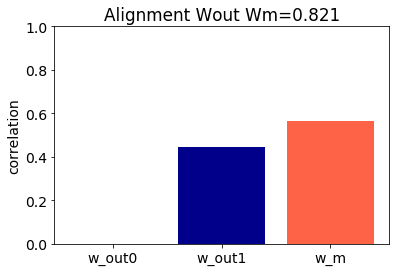

12it [00:00, 113.88it/s]

start 1000 end 1800 


200it [00:01, 126.86it/s]
8it [00:00, 78.58it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 90.26it/s]
200it [00:01, 119.45it/s]


AR early fit 0.955, late fit 0.958


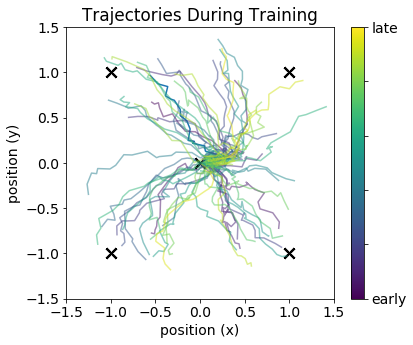

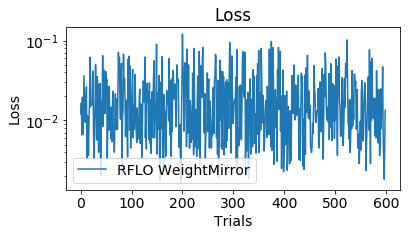

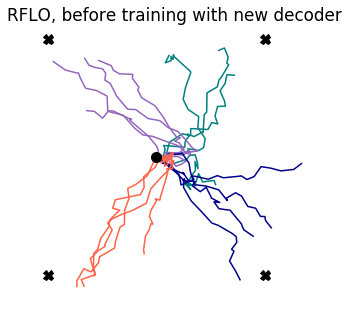

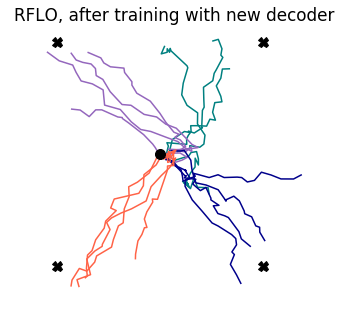

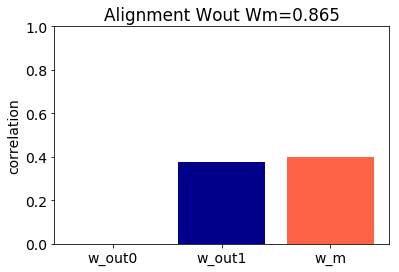

12it [00:00, 119.79it/s]

start 1200 end 2000 


200it [00:01, 125.29it/s]
8it [00:00, 77.67it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 92.56it/s]
200it [00:01, 124.69it/s]


AR early fit 0.958, late fit 0.960


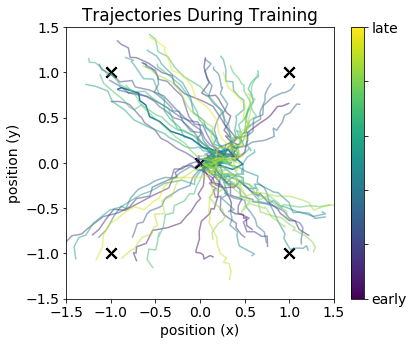

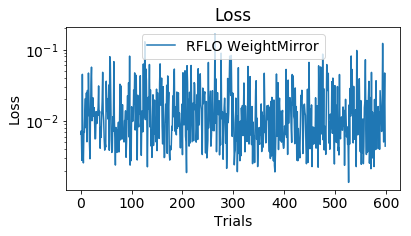

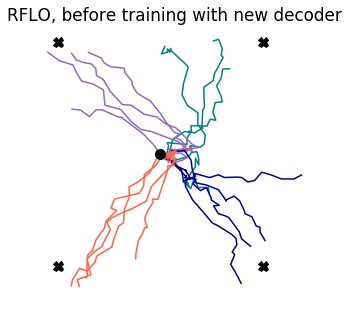

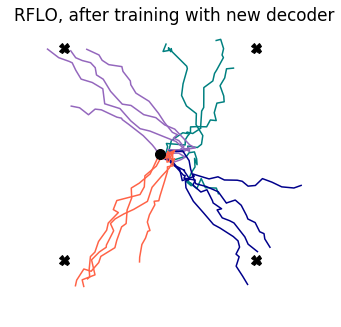

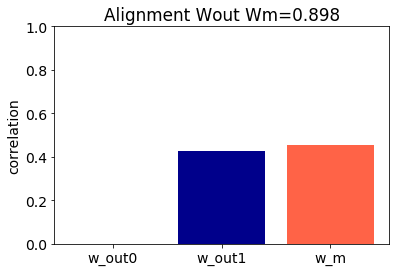

13it [00:00, 124.74it/s]

start 1400 end 2200 


200it [00:02, 92.52it/s]
6it [00:00, 58.32it/s]

>>APPLY WEIGHT MIRRORING


600it [00:08, 74.07it/s]
200it [00:02, 95.04it/s]


AR early fit 0.960, late fit 0.962


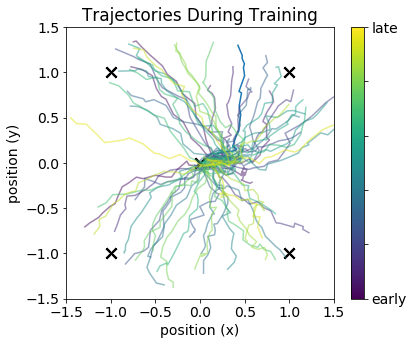

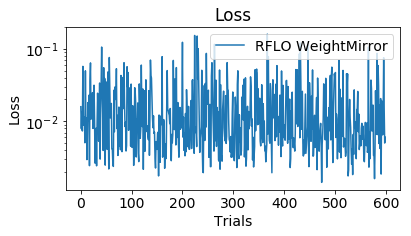

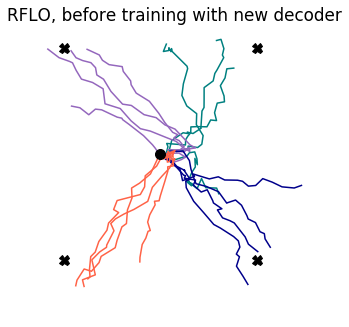

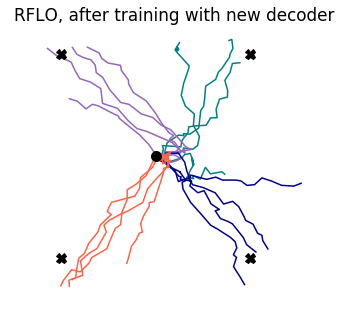

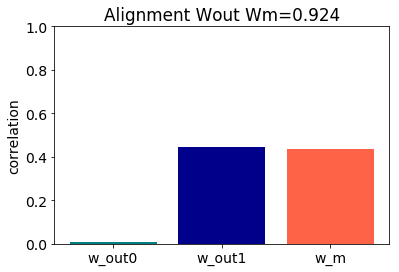

12it [00:00, 119.07it/s]

start 1600 end 2400 


200it [00:02, 79.21it/s]
1it [00:00,  8.83it/s]

>>APPLY WEIGHT MIRRORING


600it [00:09, 62.73it/s]
200it [00:01, 120.87it/s]


AR early fit 0.962, late fit 0.963


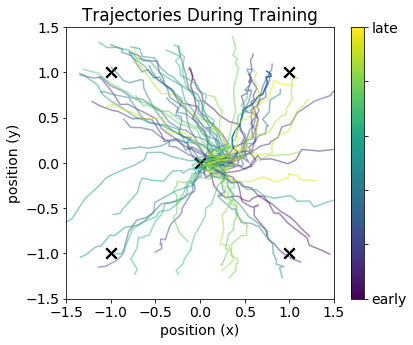

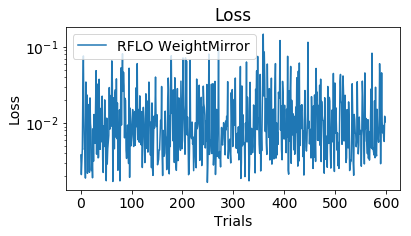

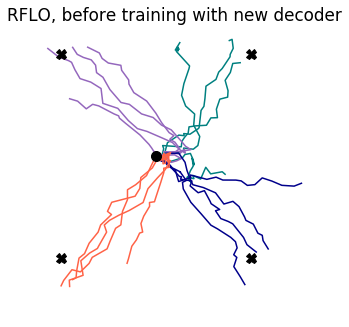

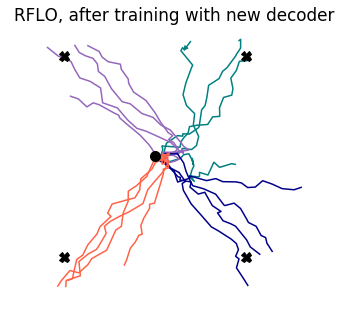

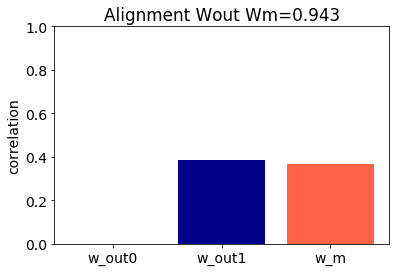

11it [00:00, 105.79it/s]

start 1800 end 2600 


200it [00:02, 68.20it/s]
1it [00:00,  8.64it/s]

>>APPLY WEIGHT MIRRORING


600it [00:08, 69.32it/s]
200it [00:02, 88.67it/s] 


AR early fit 0.963, late fit 0.964


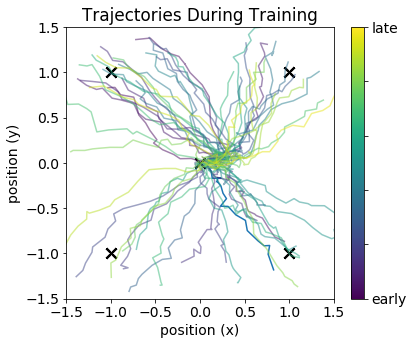

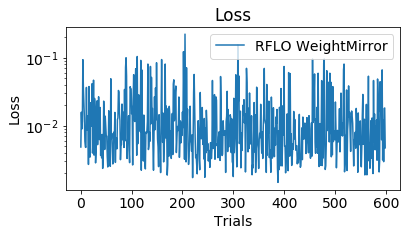

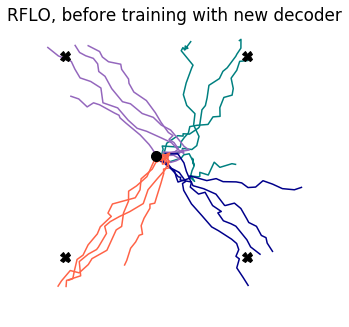

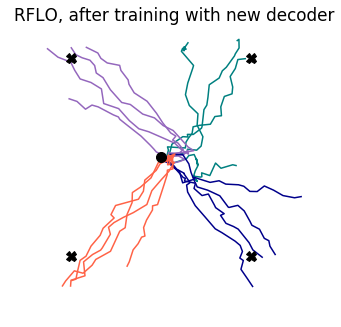

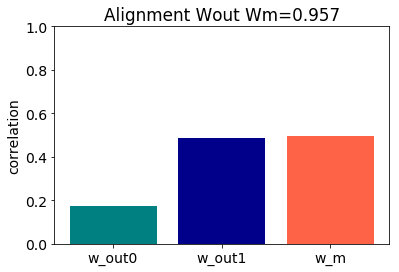

13it [00:00, 125.18it/s]

start 2000 end 2800 


200it [00:02, 94.64it/s]
6it [00:00, 47.96it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 76.76it/s]
200it [00:02, 95.15it/s] 


AR early fit 0.964, late fit 0.965


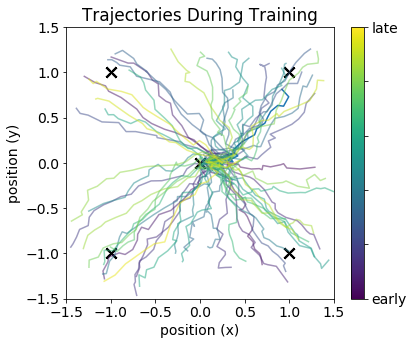

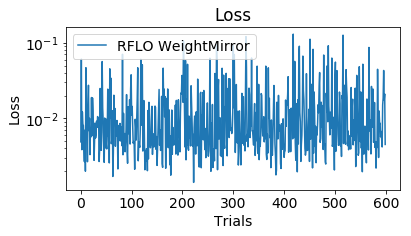

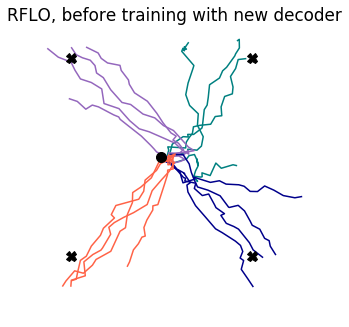

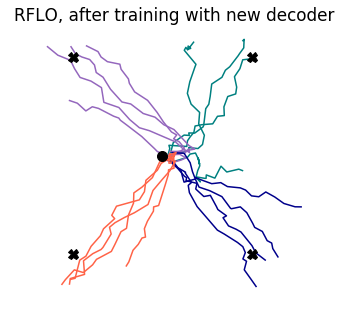

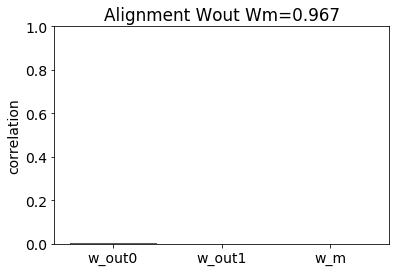

9it [00:00, 73.55it/s]

start 2200 end 3000 


200it [00:02, 72.29it/s]
7it [00:00, 69.65it/s]

>>APPLY WEIGHT MIRRORING


600it [00:08, 68.43it/s]
200it [00:01, 116.15it/s]


AR early fit 0.965, late fit 0.965


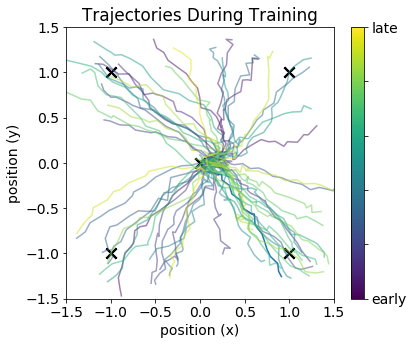

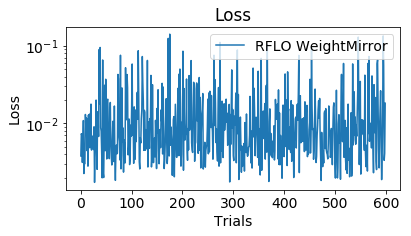

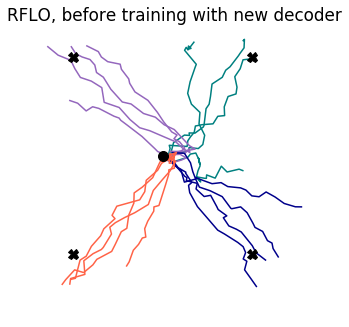

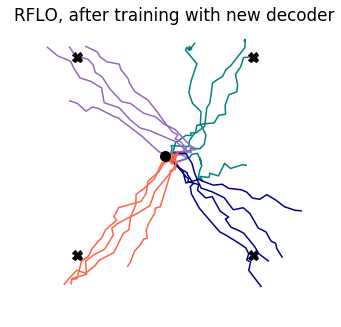

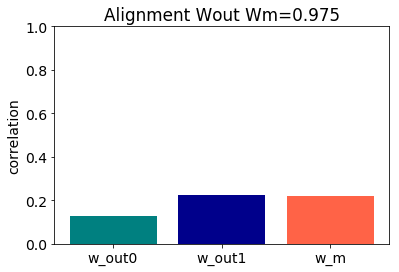

0it [00:00, ?it/s]

start 2400 end 3200 


200it [00:02, 96.57it/s]
8it [00:00, 72.12it/s]

>>APPLY WEIGHT MIRRORING


600it [00:08, 74.14it/s]
200it [00:02, 69.89it/s]


AR early fit 0.965, late fit 0.966


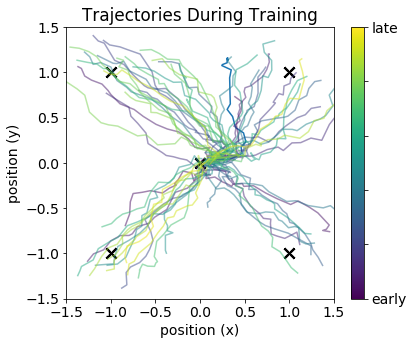

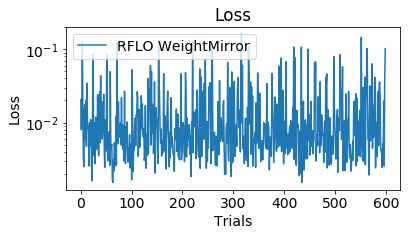

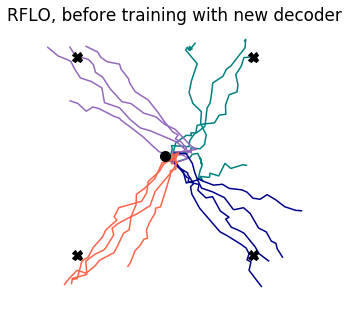

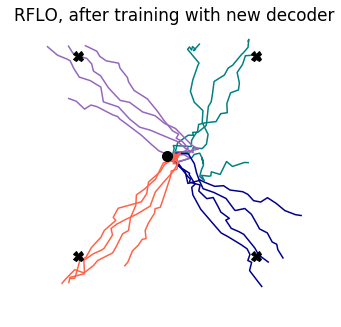

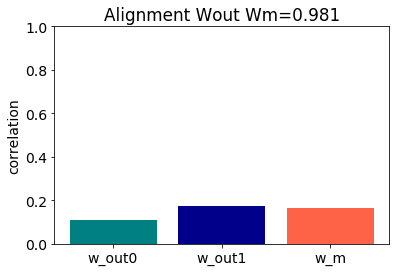

12it [00:00, 113.67it/s]

start 2600 end 3400 


200it [00:02, 84.09it/s]
9it [00:00, 83.52it/s]

>>APPLY WEIGHT MIRRORING


600it [00:08, 66.80it/s]
200it [00:01, 111.45it/s]


AR early fit 0.966, late fit 0.967


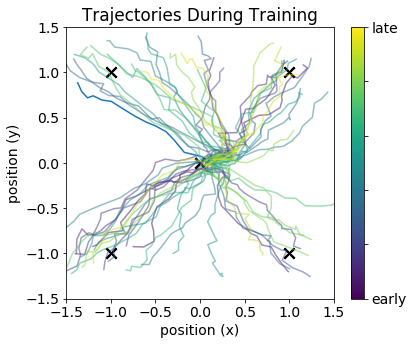

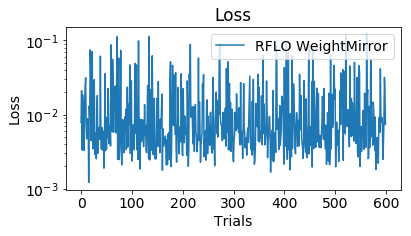

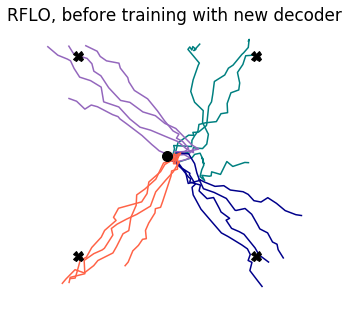

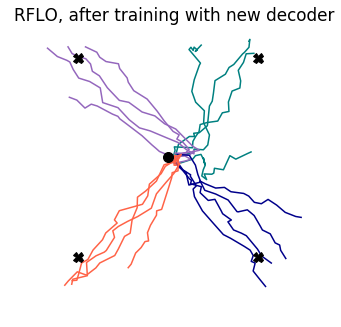

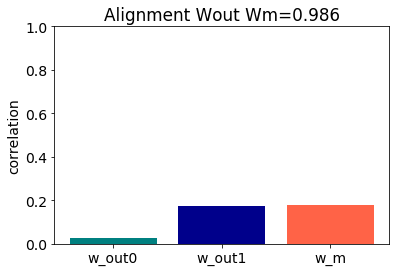

12it [00:00, 116.31it/s]

start 2800 end 3600 


200it [00:01, 124.10it/s]
8it [00:00, 78.49it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 79.81it/s]
200it [00:01, 112.70it/s]


AR early fit 0.967, late fit 0.967


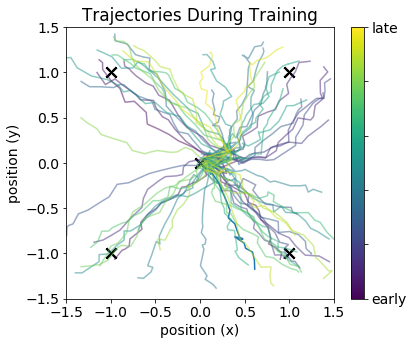

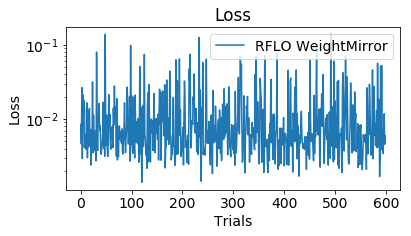

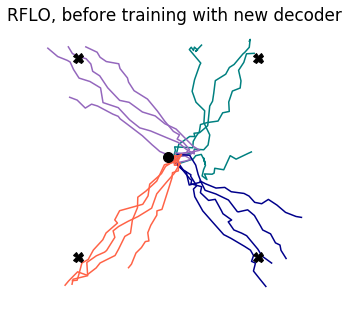

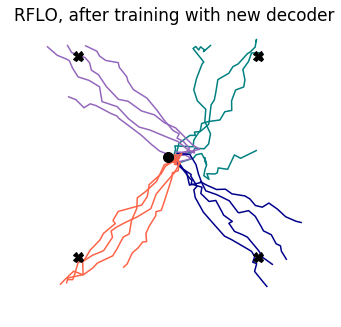

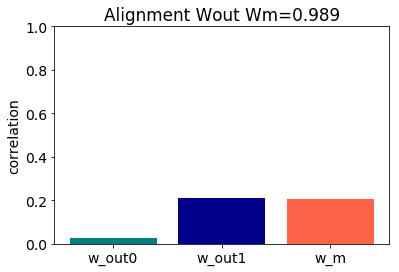

10it [00:00, 98.15it/s]

start 3000 end 3800 


200it [00:01, 106.60it/s]
8it [00:00, 74.70it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 88.34it/s]
200it [00:01, 125.98it/s]


AR early fit 0.967, late fit 0.968


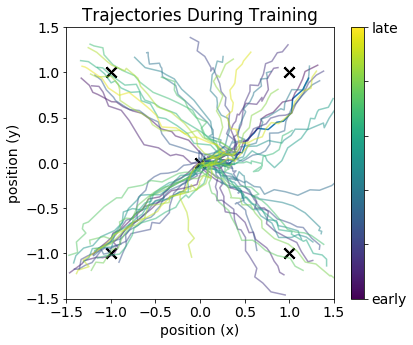

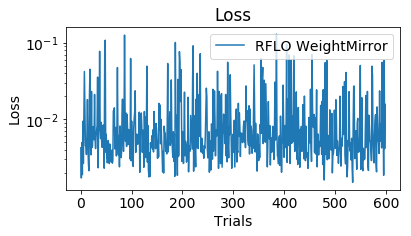

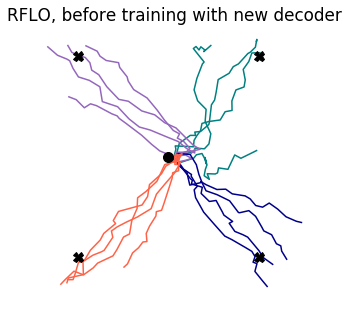

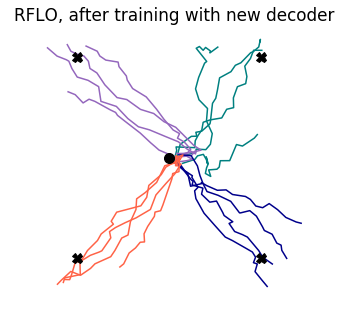

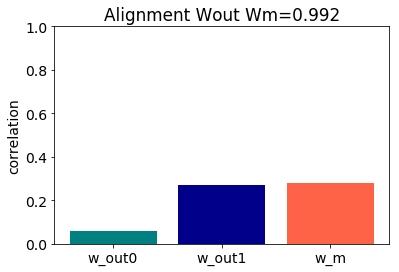

12it [00:00, 118.03it/s]

start 3200 end 4000 


200it [00:01, 120.52it/s]
8it [00:00, 77.52it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 93.40it/s]
200it [00:01, 125.29it/s]


AR early fit 0.968, late fit 0.968


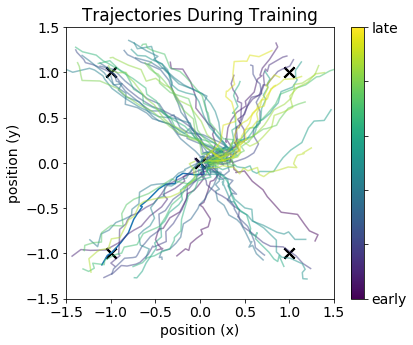

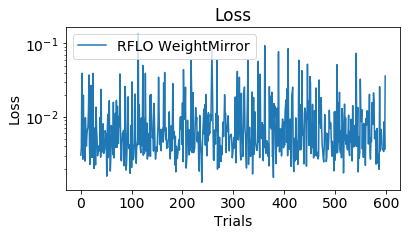

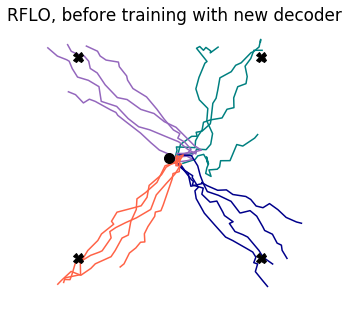

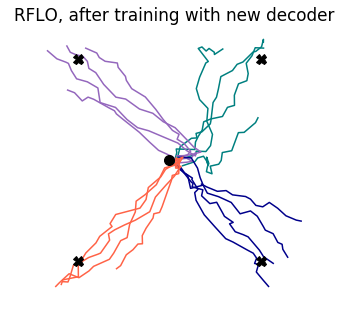

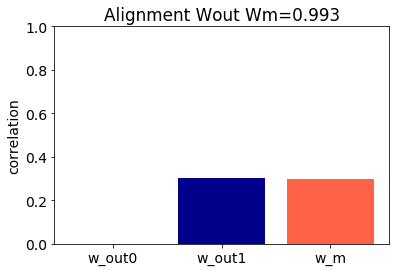

12it [00:00, 115.70it/s]

start 3400 end 4200 


200it [00:01, 124.06it/s]
8it [00:00, 73.62it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 90.41it/s]
200it [00:01, 122.92it/s]


AR early fit 0.968, late fit 0.969


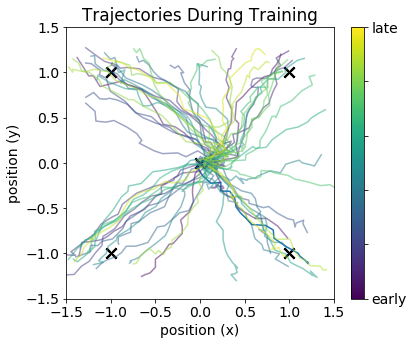

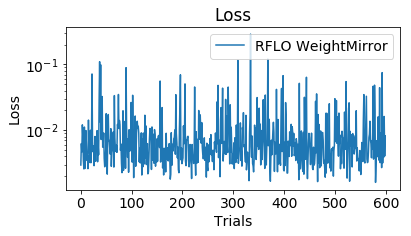

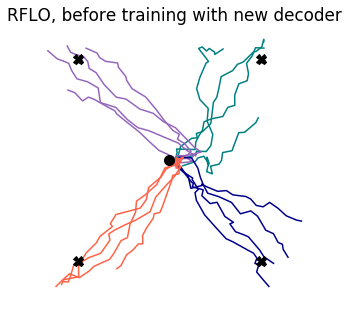

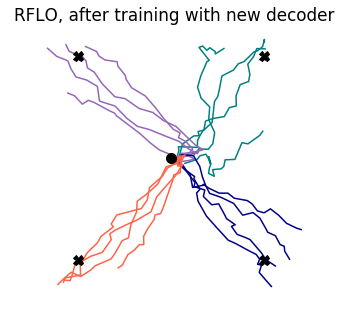

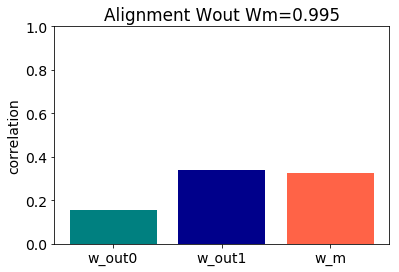

11it [00:00, 105.08it/s]

start 3600 end 4400 


200it [00:01, 123.24it/s]
8it [00:00, 77.62it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 92.39it/s]
200it [00:01, 123.17it/s]


AR early fit 0.969, late fit 0.969


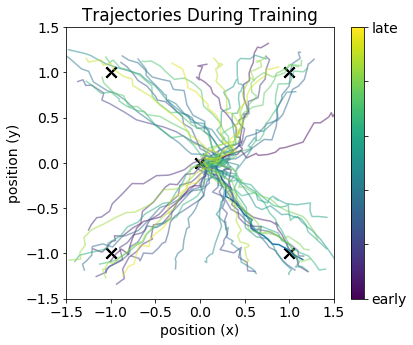

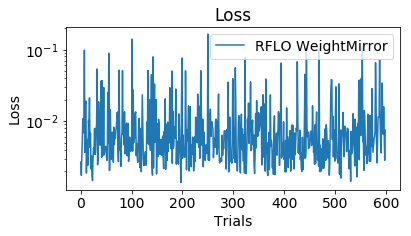

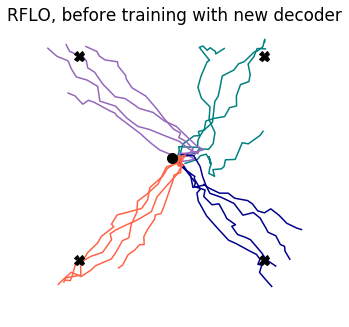

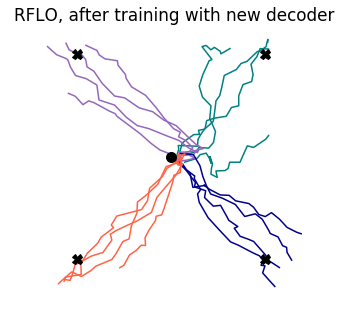

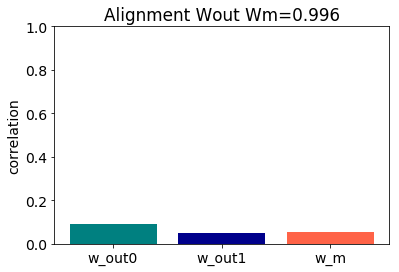

12it [00:00, 116.83it/s]

start 3800 end 4600 


200it [00:01, 126.18it/s]
8it [00:00, 77.25it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 89.10it/s]
200it [00:01, 126.44it/s]


AR early fit 0.969, late fit 0.970


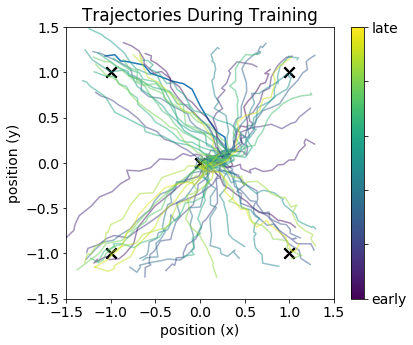

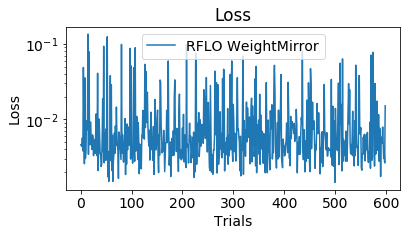

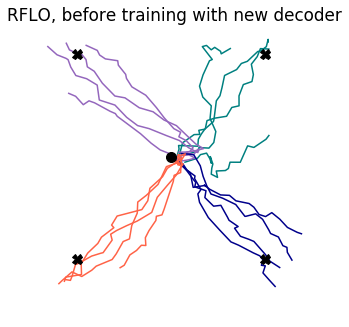

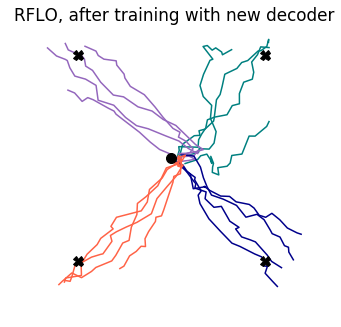

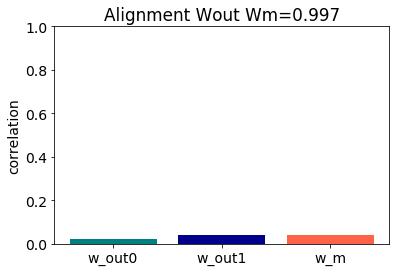

11it [00:00, 105.53it/s]

start 4000 end 4800 
M norm: 1.07	 M angle: 0.39, 6 iterations
w_out1 norm: 1.57	 w_out vs. w_out1 angle: 0.40
w_m norm: 1.07	 w_out1 vs. w_m angle: 0.39
w_m norm: 1.81	 w_out vs. w_m angle: 0.09start 0 end 800 


200it [00:01, 118.09it/s]
1it [00:00,  9.11it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 92.20it/s]
200it [00:01, 127.51it/s]


AR early fit 0.920, late fit 0.918


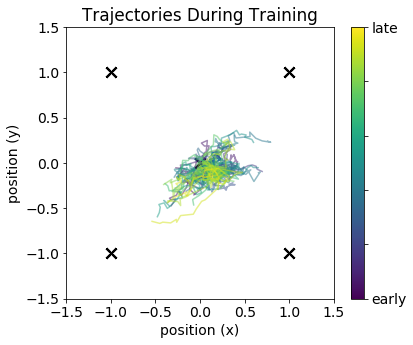

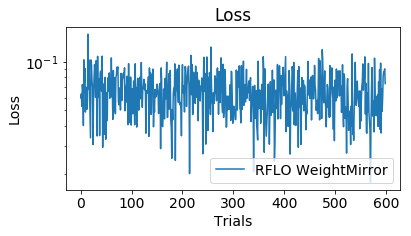

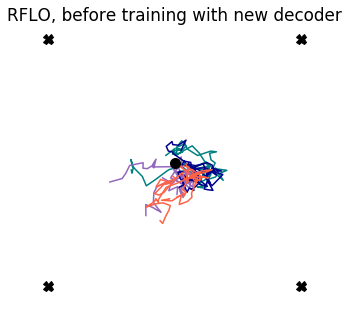

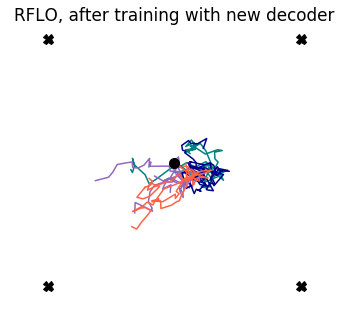

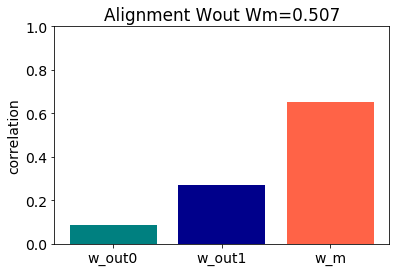

12it [00:00, 116.17it/s]

start 200 end 1000 


200it [00:01, 123.29it/s]
8it [00:00, 77.13it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 93.19it/s]
200it [00:01, 126.49it/s]


AR early fit 0.918, late fit 0.922


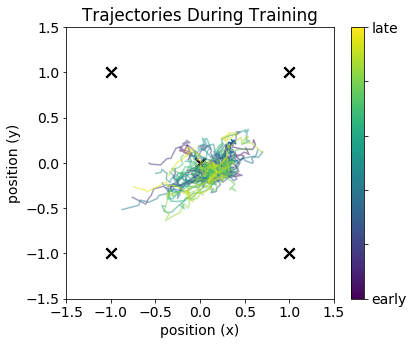

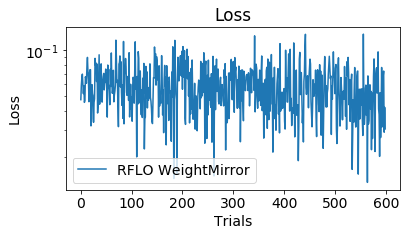

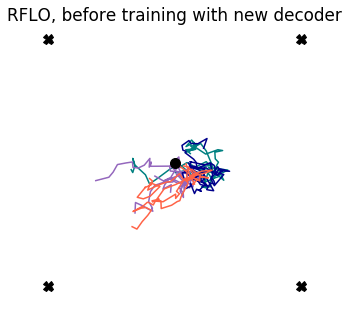

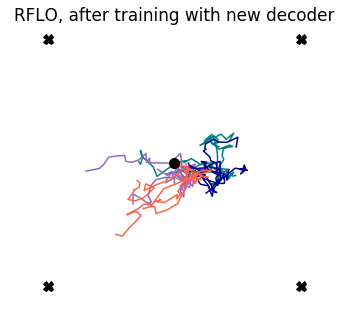

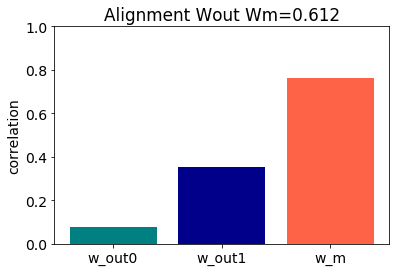

12it [00:00, 118.94it/s]

start 400 end 1200 


200it [00:01, 125.30it/s]
8it [00:00, 77.61it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 89.94it/s]
200it [00:01, 123.34it/s]


AR early fit 0.922, late fit 0.927


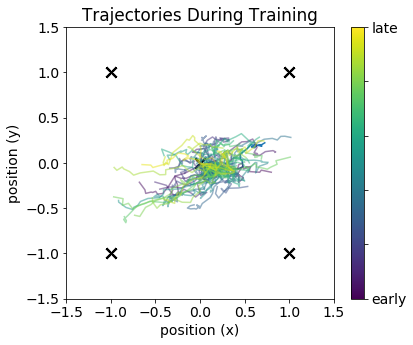

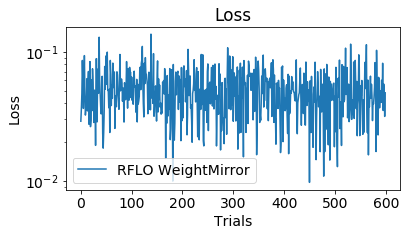

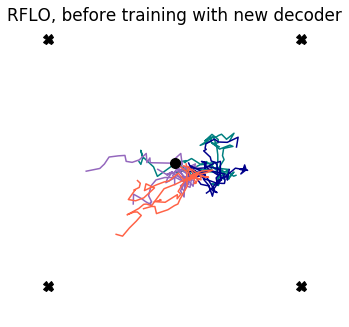

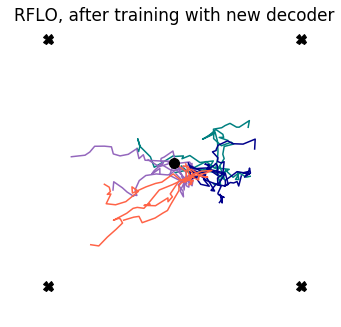

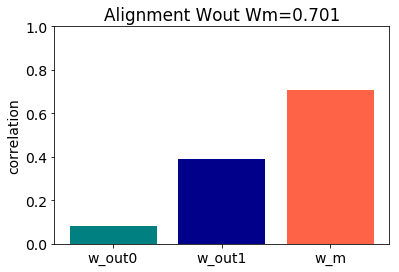

11it [00:00, 107.48it/s]

start 600 end 1400 


200it [00:01, 118.85it/s]
8it [00:00, 74.79it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 92.72it/s]
200it [00:01, 120.14it/s]


AR early fit 0.927, late fit 0.933


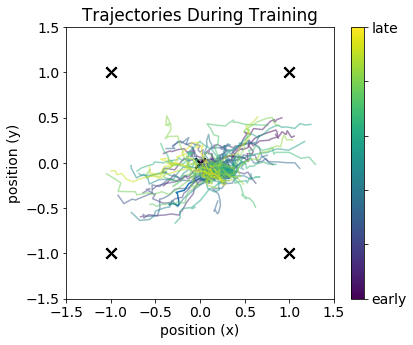

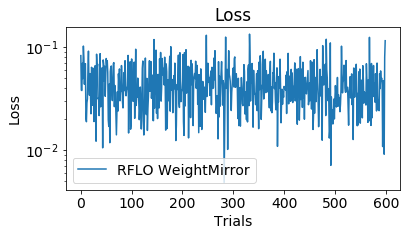

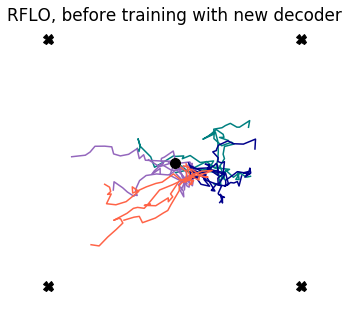

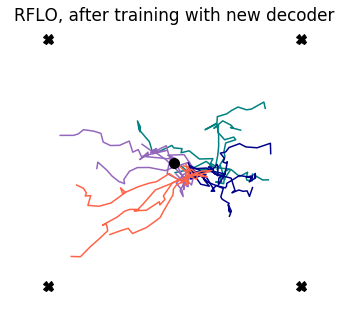

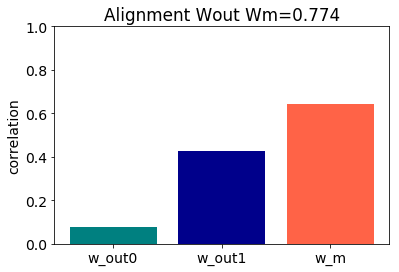

11it [00:00, 109.41it/s]

start 800 end 1600 


200it [00:01, 124.97it/s]
8it [00:00, 75.77it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 90.39it/s]
200it [00:01, 103.98it/s]


AR early fit 0.933, late fit 0.939


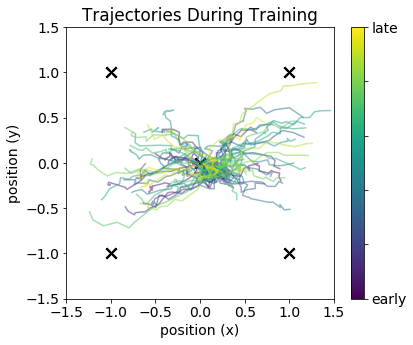

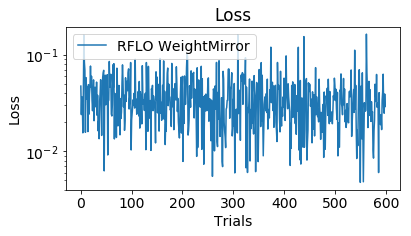

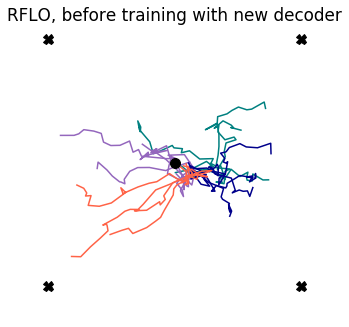

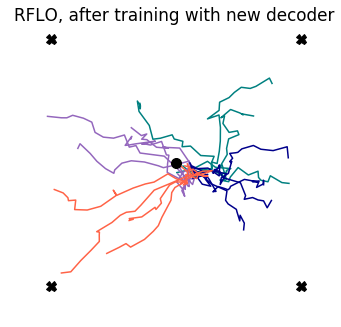

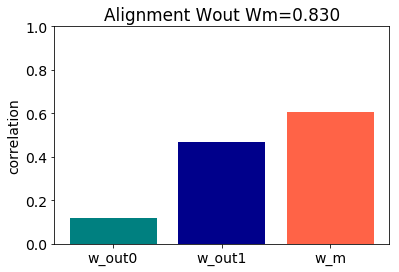

9it [00:00, 81.56it/s]

start 1000 end 1800 


200it [00:01, 115.55it/s]
1it [00:00,  8.52it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 81.04it/s]
200it [00:02, 112.46it/s]


AR early fit 0.939, late fit 0.944


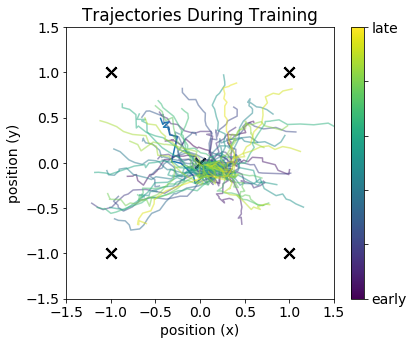

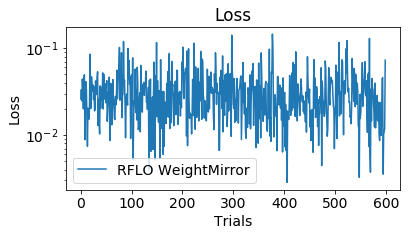

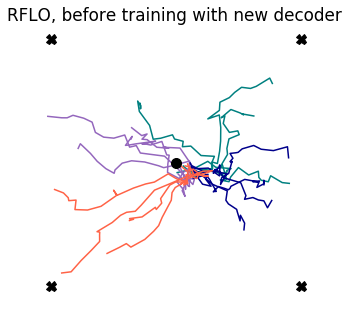

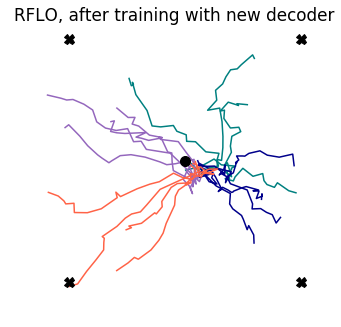

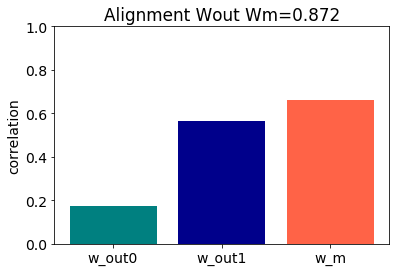

9it [00:00, 88.28it/s]

start 1200 end 2000 


200it [00:02, 49.46it/s]
6it [00:00, 56.79it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 84.69it/s]
200it [00:01, 127.01it/s]


AR early fit 0.944, late fit 0.948


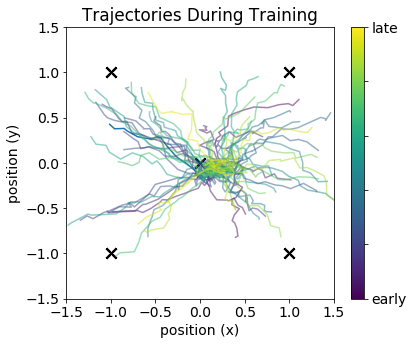

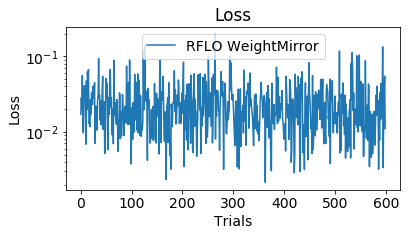

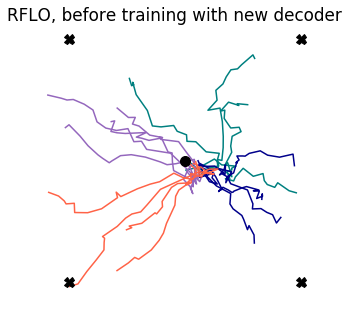

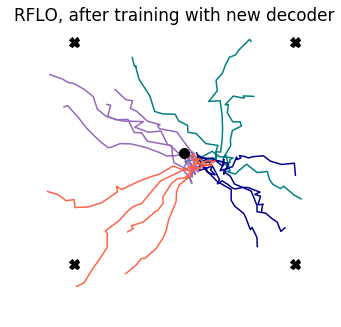

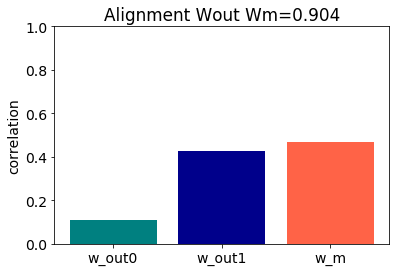

14it [00:00, 131.83it/s]

start 1400 end 2200 


200it [00:01, 126.59it/s]
9it [00:00, 88.30it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 94.37it/s]
200it [00:01, 127.08it/s]


AR early fit 0.948, late fit 0.951


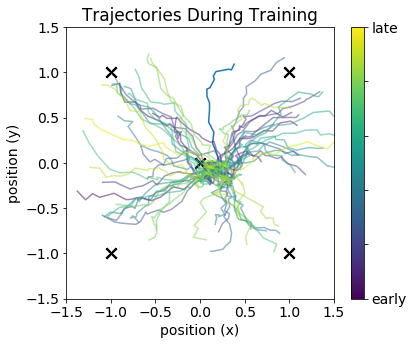

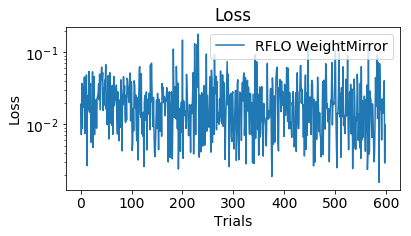

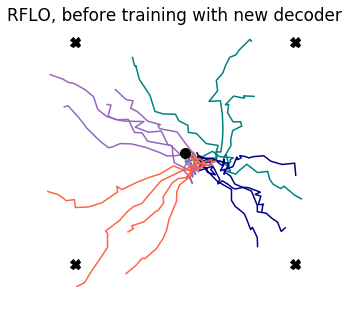

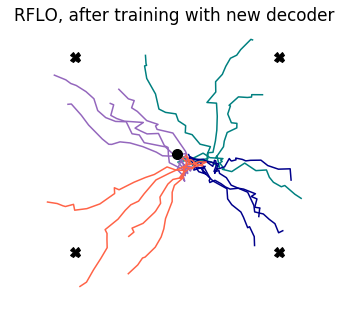

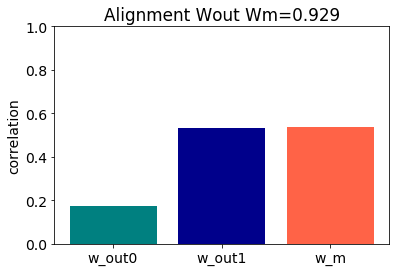

10it [00:00, 99.80it/s]

start 1600 end 2400 


200it [00:01, 111.14it/s]
8it [00:00, 79.96it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 90.97it/s]
200it [00:01, 124.36it/s]


AR early fit 0.951, late fit 0.954


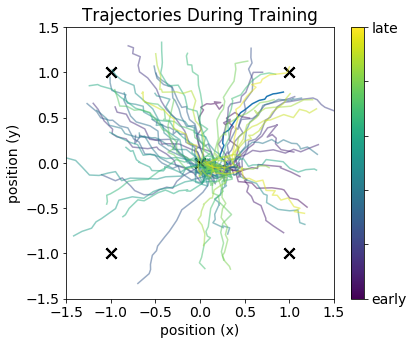

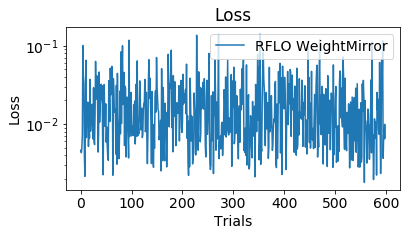

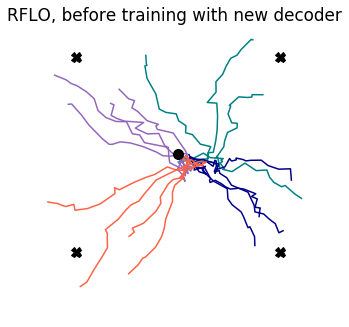

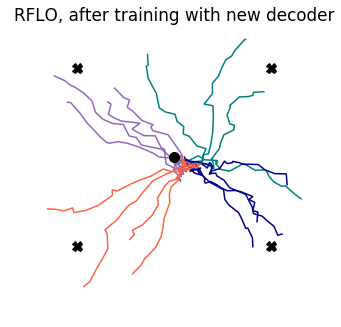

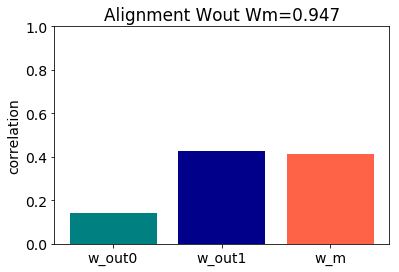

13it [00:00, 125.64it/s]

start 1800 end 2600 


200it [00:01, 124.49it/s]
9it [00:00, 87.45it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 92.03it/s]
200it [00:01, 124.74it/s]


AR early fit 0.954, late fit 0.956


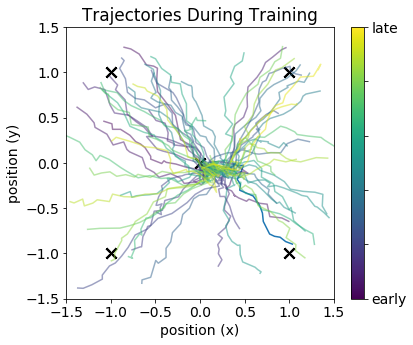

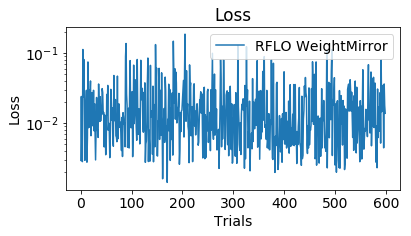

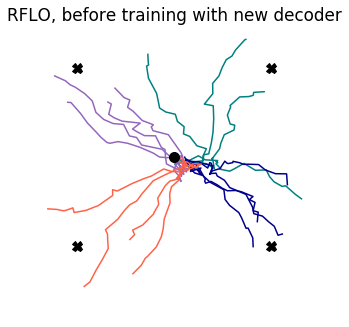

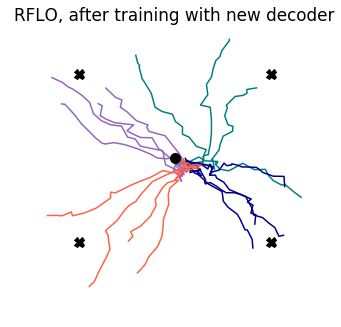

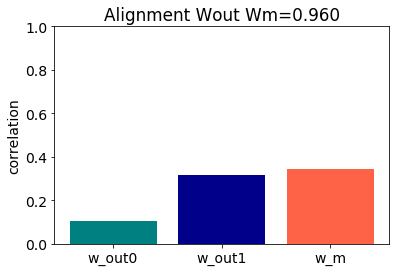

14it [00:00, 128.56it/s]

start 2000 end 2800 


200it [00:01, 125.78it/s]
9it [00:00, 86.89it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 87.57it/s]
200it [00:01, 125.04it/s]


AR early fit 0.956, late fit 0.957


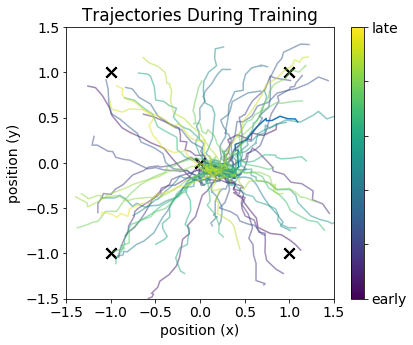

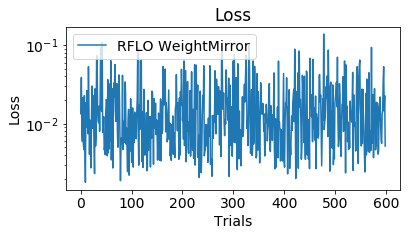

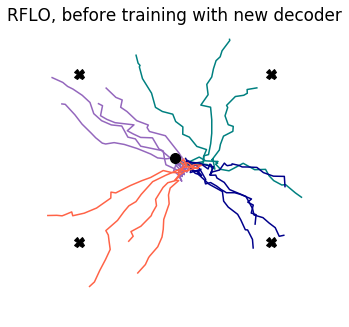

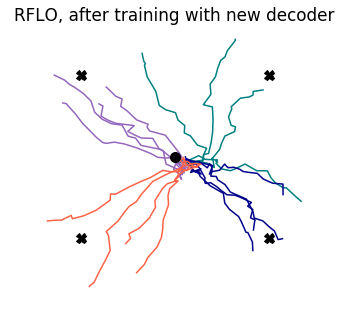

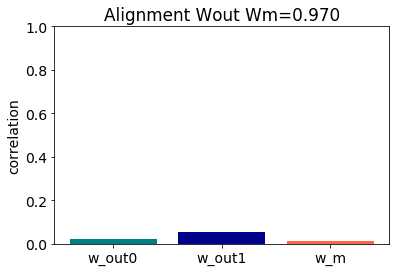

12it [00:00, 118.57it/s]

start 2200 end 3000 


200it [00:01, 123.65it/s]
9it [00:00, 84.01it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 88.62it/s]
200it [00:01, 107.89it/s]


AR early fit 0.957, late fit 0.958


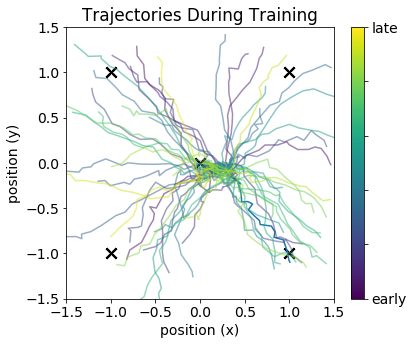

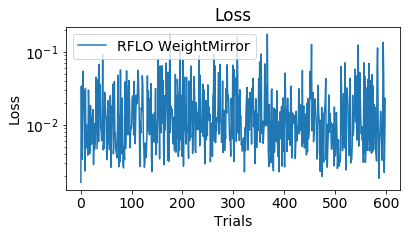

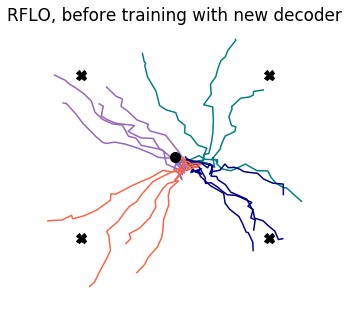

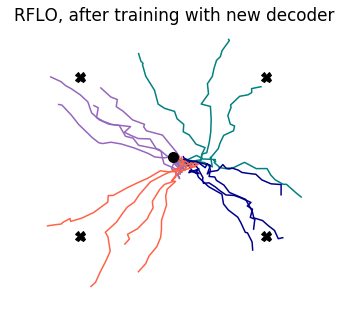

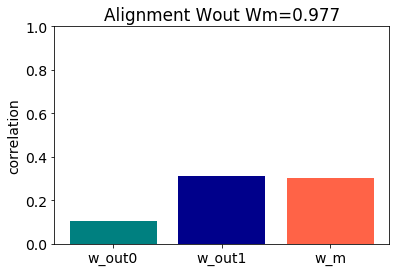

13it [00:00, 122.99it/s]

start 2400 end 3200 


200it [00:01, 127.32it/s]
9it [00:00, 82.75it/s]

>>APPLY WEIGHT MIRRORING


600it [00:08, 74.29it/s]
200it [00:02, 87.74it/s]


AR early fit 0.958, late fit 0.959


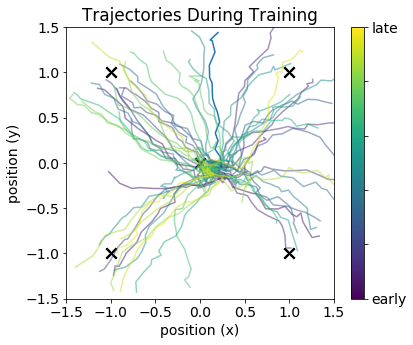

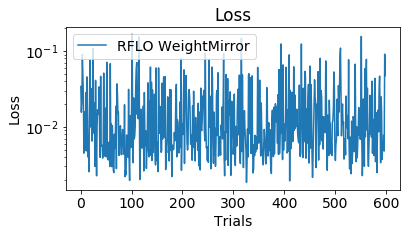

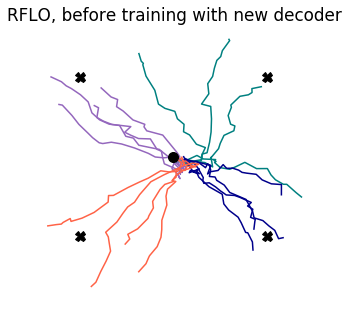

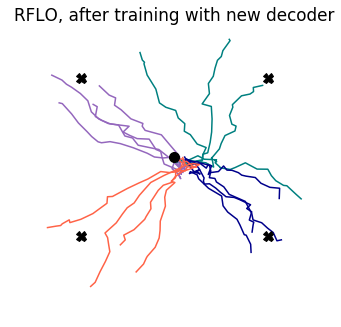

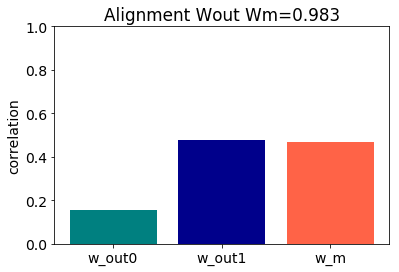

10it [00:00, 97.87it/s]

start 2600 end 3400 


200it [00:02, 74.69it/s]
6it [00:00, 57.89it/s]

>>APPLY WEIGHT MIRRORING


600it [00:13, 44.67it/s]
200it [00:04, 43.17it/s]


AR early fit 0.959, late fit 0.960


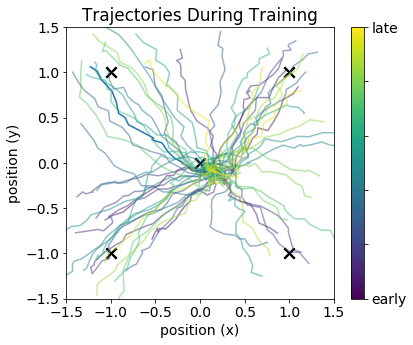

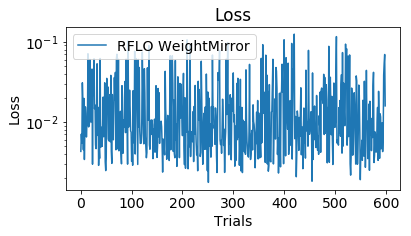

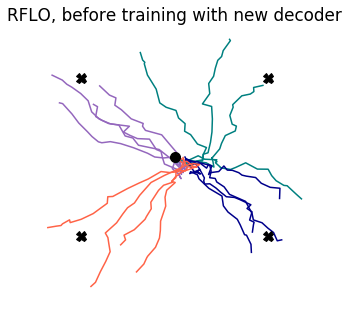

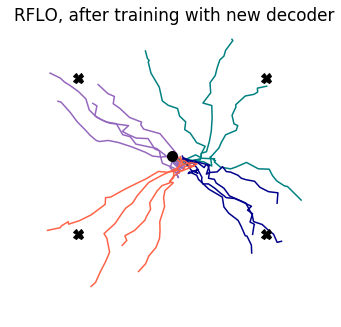

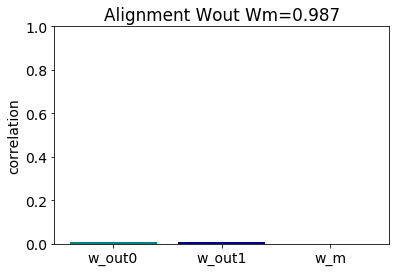

10it [00:00, 89.24it/s]

start 2800 end 3600 


200it [00:03, 63.13it/s]
8it [00:00, 79.94it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 85.45it/s]
200it [00:01, 102.56it/s]


AR early fit 0.960, late fit 0.961


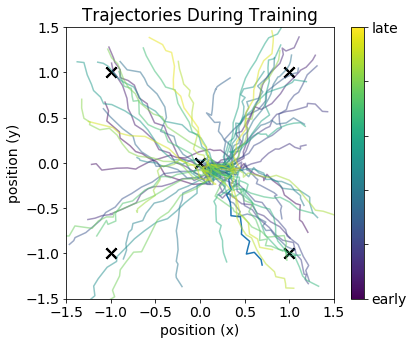

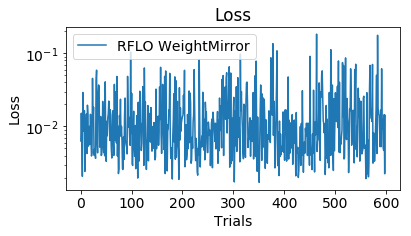

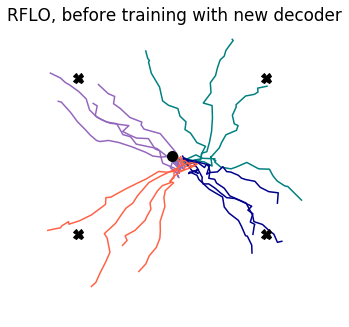

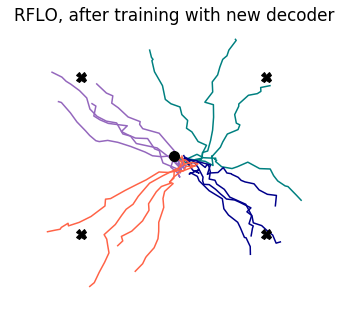

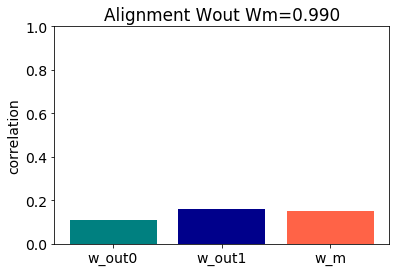

12it [00:00, 118.57it/s]

start 3000 end 3800 


200it [00:01, 121.33it/s]
8it [00:00, 73.23it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 88.53it/s]
200it [00:02, 97.24it/s]


AR early fit 0.961, late fit 0.961


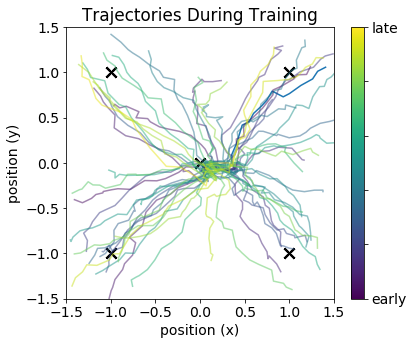

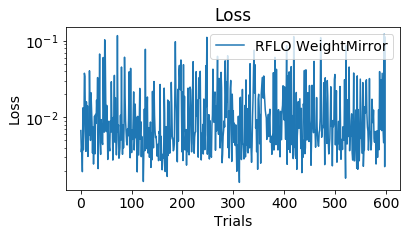

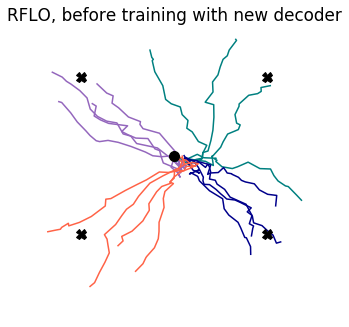

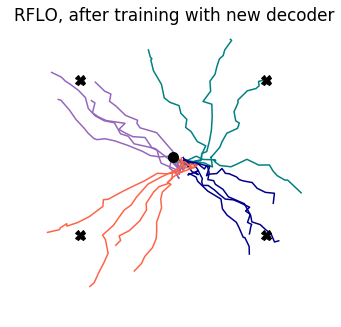

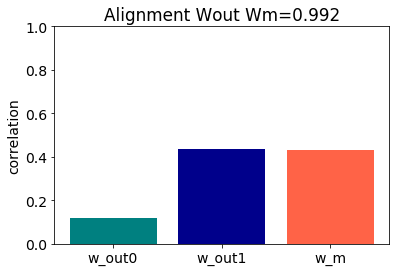

9it [00:00, 89.72it/s]

start 3200 end 4000 


200it [00:02, 96.08it/s]
1it [00:00,  9.44it/s]

>>APPLY WEIGHT MIRRORING


600it [00:09, 62.67it/s]
200it [00:02, 74.03it/s]


AR early fit 0.961, late fit 0.962


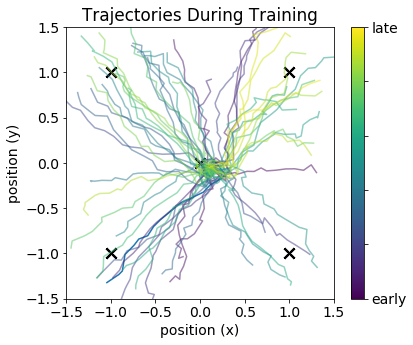

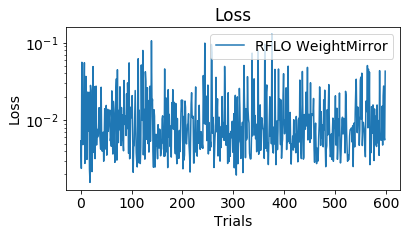

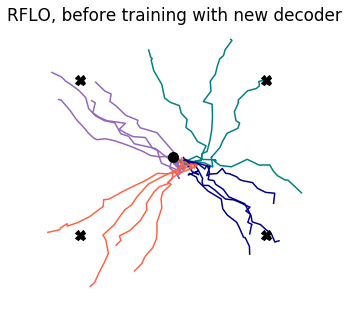

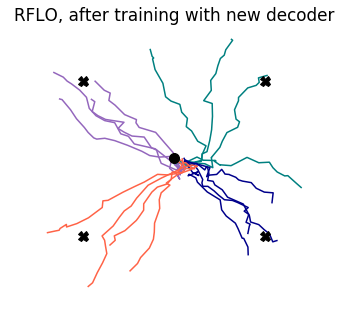

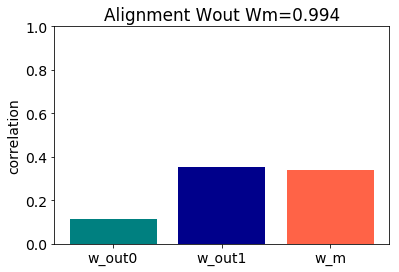

3it [00:00, 28.04it/s]

start 3400 end 4200 


200it [00:02, 66.71it/s]
6it [00:00, 55.20it/s]

>>APPLY WEIGHT MIRRORING


600it [00:09, 60.30it/s]
200it [00:01, 112.08it/s]


AR early fit 0.962, late fit 0.962


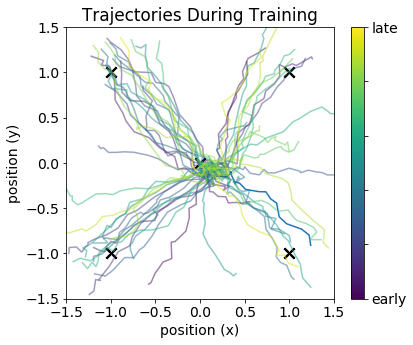

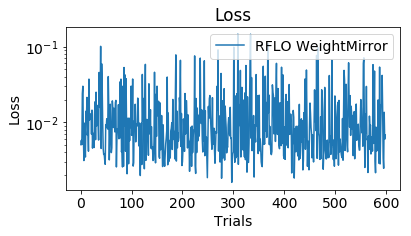

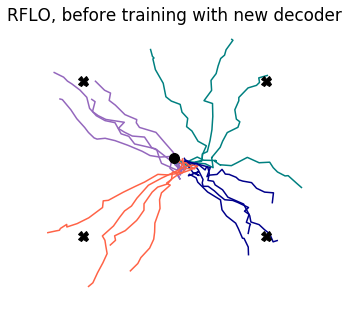

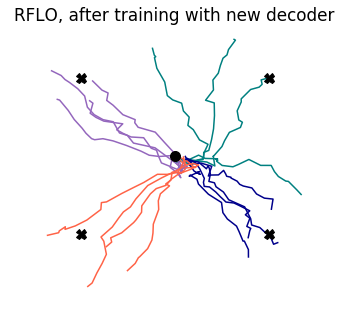

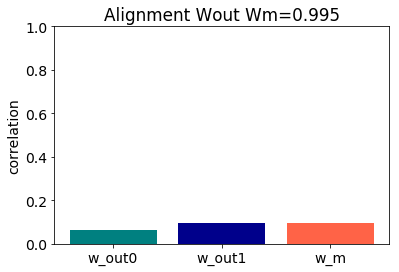

11it [00:00, 105.69it/s]

start 3600 end 4400 


200it [00:01, 100.59it/s]
7it [00:00, 65.52it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 88.85it/s]
200it [00:01, 130.49it/s]


AR early fit 0.962, late fit 0.963


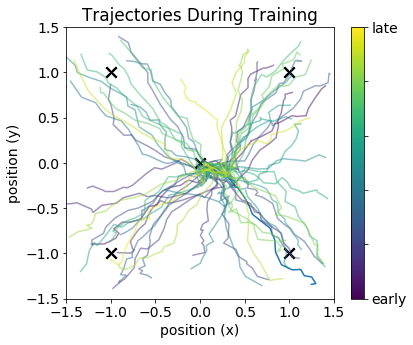

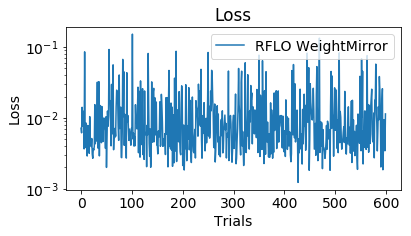

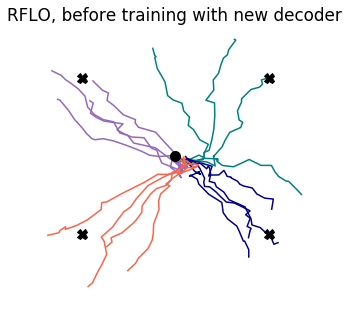

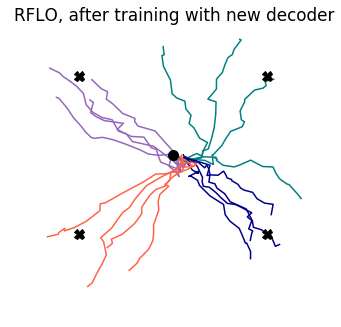

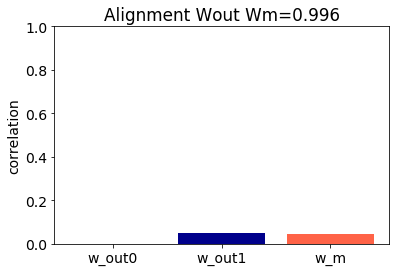

14it [00:00, 132.12it/s]

start 3800 end 4600 


200it [00:01, 126.63it/s]
9it [00:00, 84.65it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 94.43it/s]
200it [00:01, 130.24it/s]


AR early fit 0.963, late fit 0.964


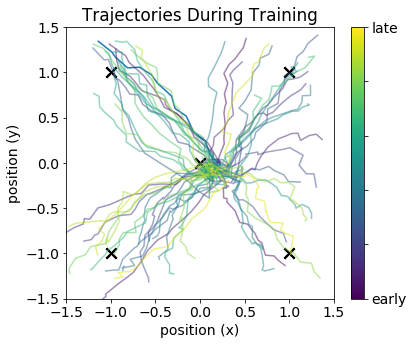

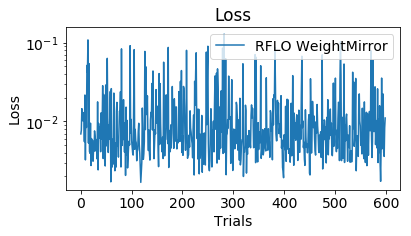

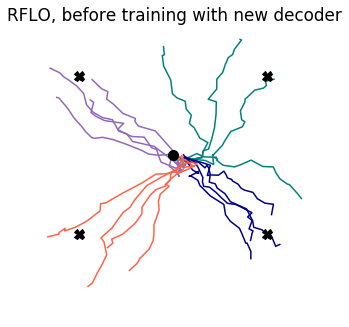

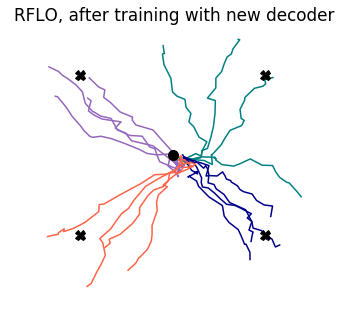

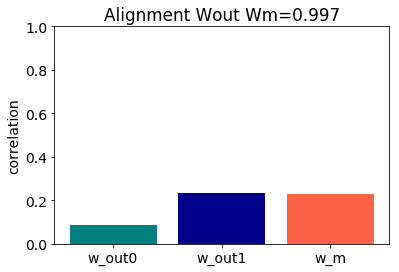

13it [00:00, 122.41it/s]

start 4000 end 4800 
M norm: 1.08	 M angle: 0.39, 3 iterations
w_out1 norm: 1.57	 w_out vs. w_out1 angle: 0.41
w_m norm: 1.08	 w_out1 vs. w_m angle: 0.39
w_m norm: 1.63	 w_out vs. w_m angle: 0.30start 0 end 800 


200it [00:01, 105.59it/s]
7it [00:00, 62.70it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 87.27it/s]
200it [00:01, 121.55it/s]


AR early fit 0.920, late fit 0.924


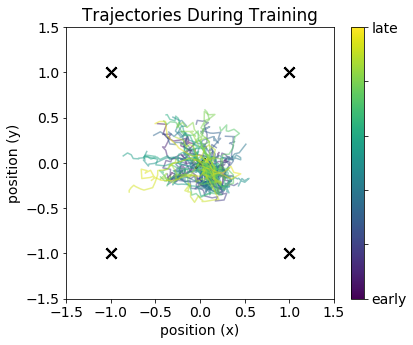

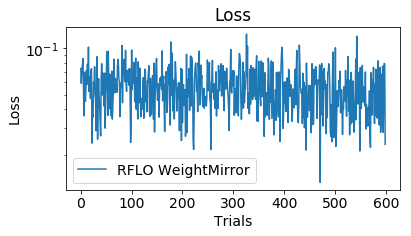

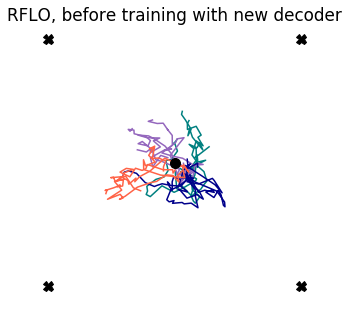

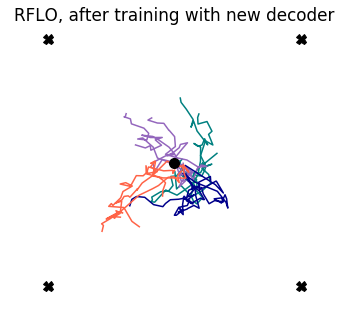

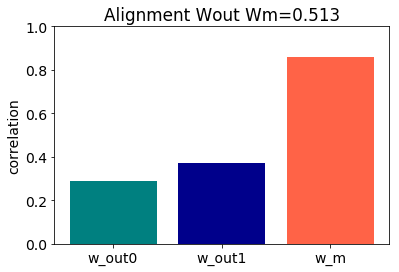

13it [00:00, 121.88it/s]

start 200 end 1000 


200it [00:01, 126.65it/s]
9it [00:00, 83.85it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 93.79it/s]
200it [00:01, 130.76it/s]


AR early fit 0.924, late fit 0.931


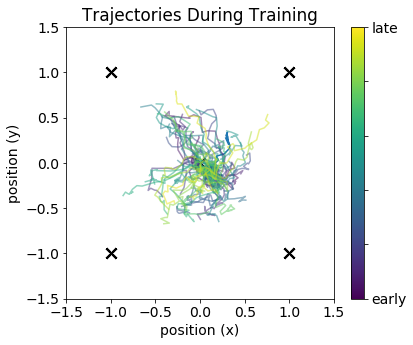

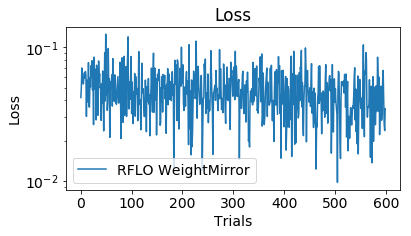

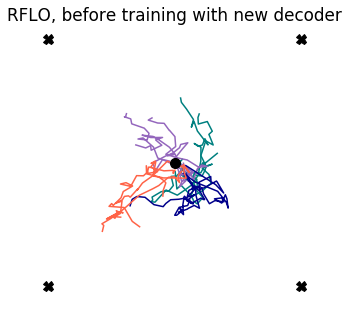

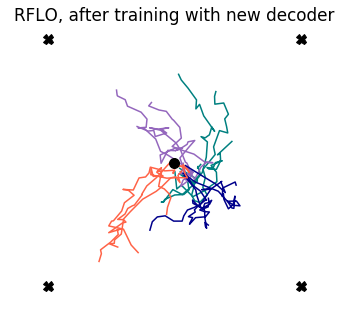

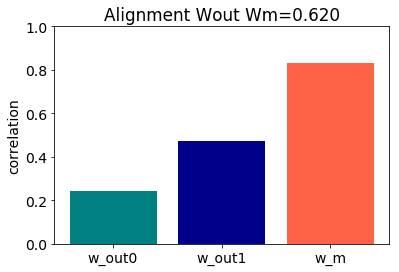

13it [00:00, 126.30it/s]

start 400 end 1200 


200it [00:01, 129.26it/s]
9it [00:00, 87.73it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 95.36it/s]
200it [00:01, 129.15it/s]


AR early fit 0.931, late fit 0.938


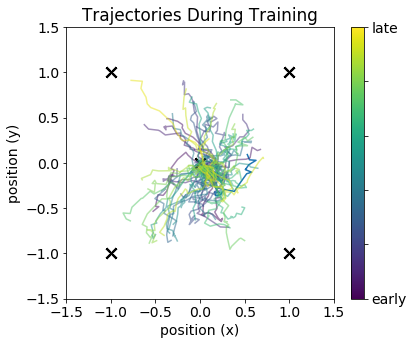

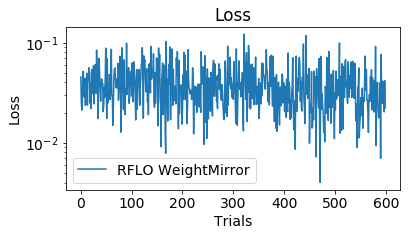

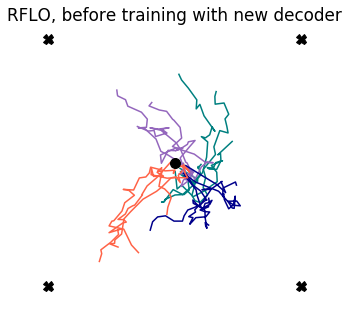

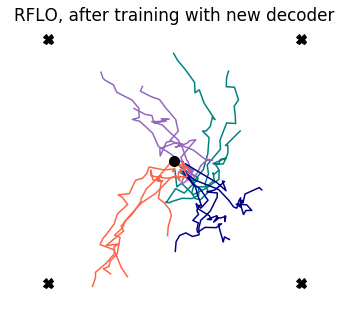

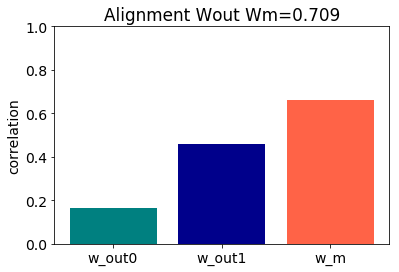

13it [00:00, 123.46it/s]

start 600 end 1400 


200it [00:01, 122.73it/s]
9it [00:00, 85.61it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 80.21it/s]
200it [00:01, 113.77it/s]


AR early fit 0.938, late fit 0.944


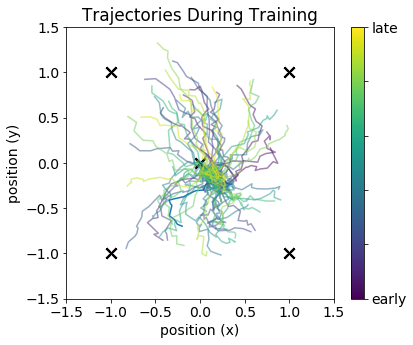

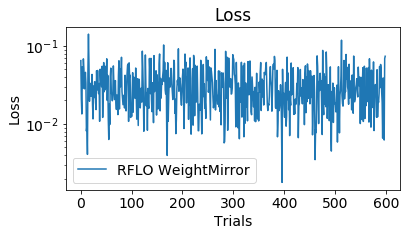

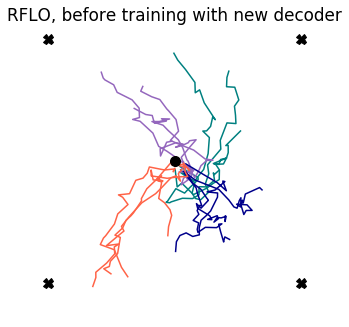

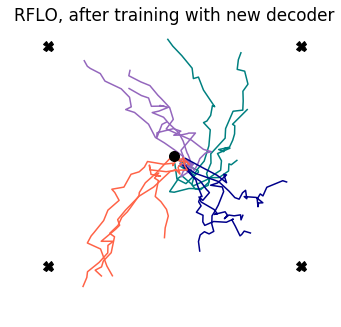

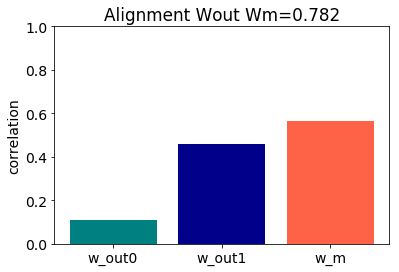

11it [00:00, 103.84it/s]

start 800 end 1600 


200it [00:01, 111.07it/s]
1it [00:00,  6.82it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 73.09it/s]
200it [00:01, 100.48it/s]


AR early fit 0.944, late fit 0.949


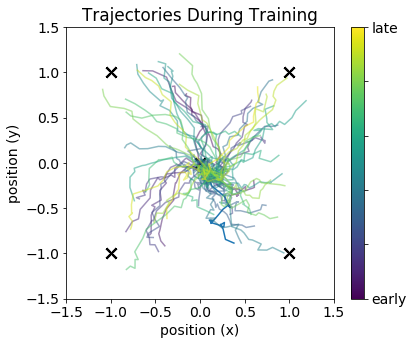

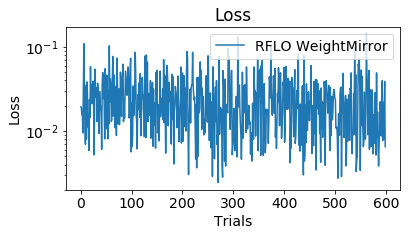

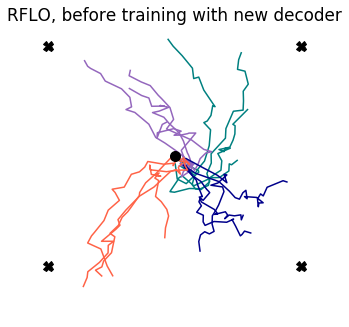

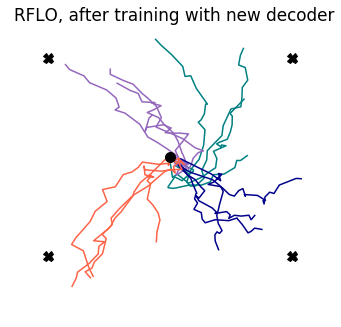

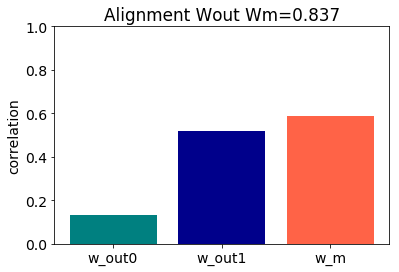

11it [00:00, 105.02it/s]

start 1000 end 1800 


200it [00:01, 108.04it/s]
6it [00:00, 55.43it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 82.18it/s]
200it [00:01, 122.17it/s]


AR early fit 0.949, late fit 0.952


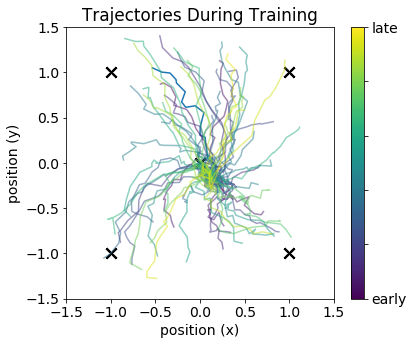

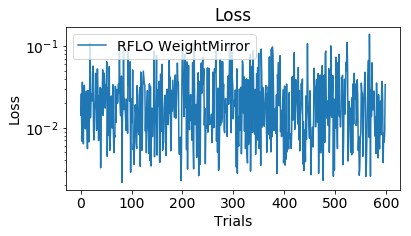

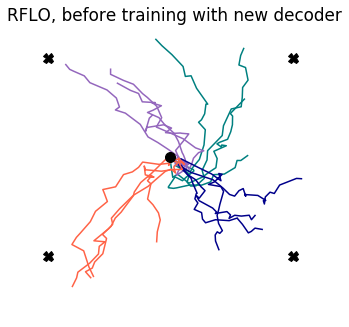

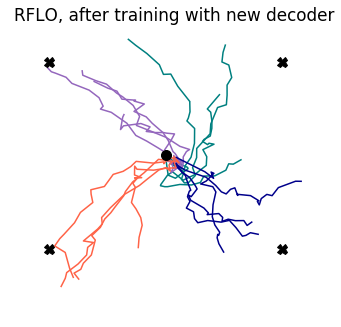

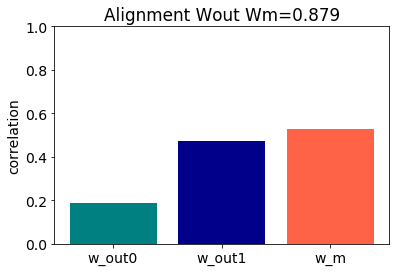

13it [00:00, 121.93it/s]

start 1200 end 2000 


200it [00:01, 123.52it/s]
8it [00:00, 75.01it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 92.29it/s]
200it [00:01, 124.69it/s]


AR early fit 0.952, late fit 0.955


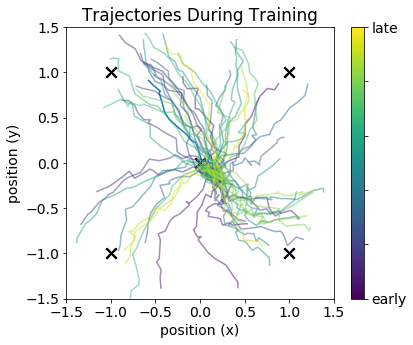

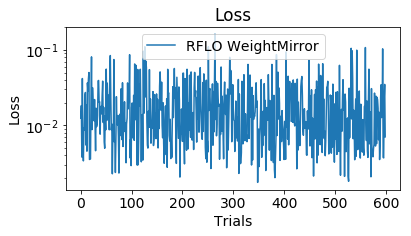

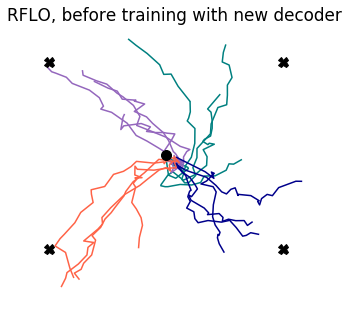

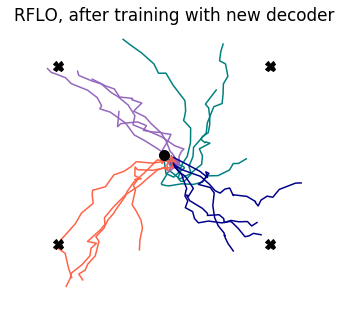

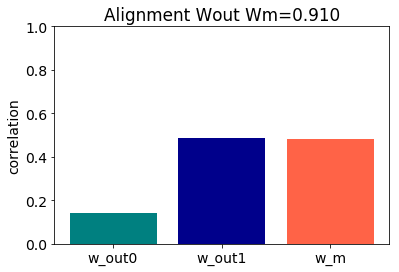

12it [00:00, 117.22it/s]

start 1400 end 2200 


200it [00:01, 123.75it/s]
7it [00:00, 68.66it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 91.80it/s]
200it [00:01, 125.20it/s]


AR early fit 0.955, late fit 0.957


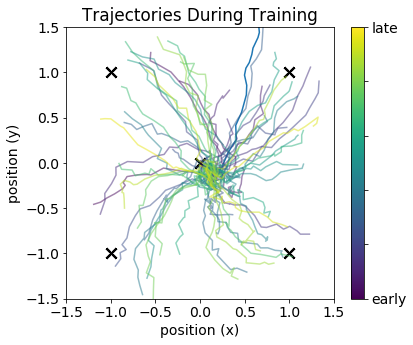

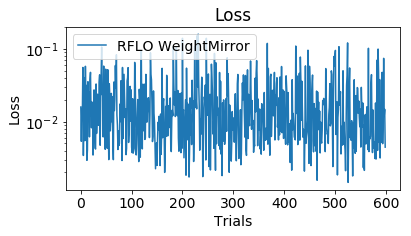

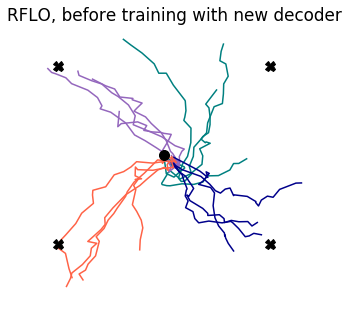

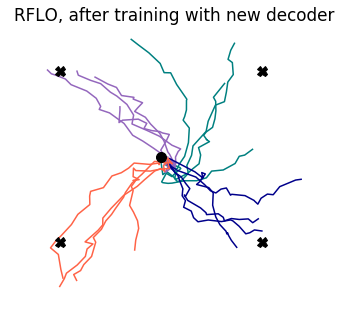

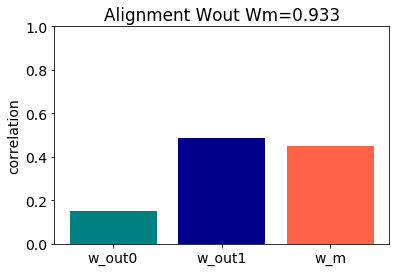

11it [00:00, 103.64it/s]

start 1600 end 2400 


200it [00:01, 122.22it/s]
7it [00:00, 69.65it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 90.83it/s]
200it [00:01, 125.06it/s]


AR early fit 0.957, late fit 0.958


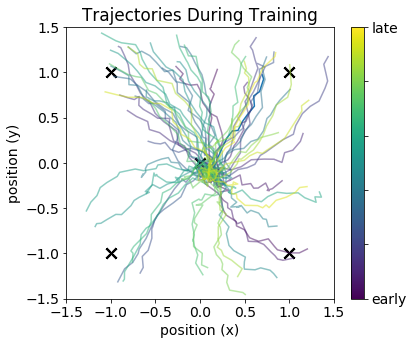

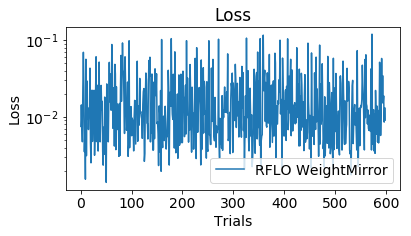

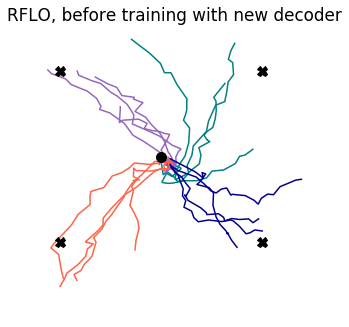

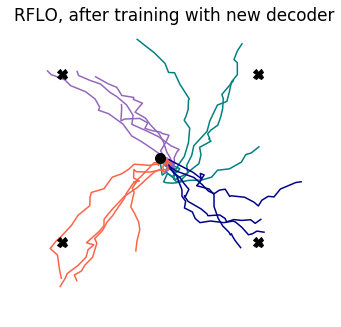

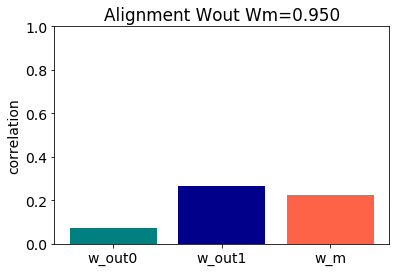

12it [00:00, 114.63it/s]

start 1800 end 2600 


200it [00:01, 118.61it/s]
8it [00:00, 78.78it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 92.75it/s]
200it [00:01, 126.01it/s]


AR early fit 0.958, late fit 0.959


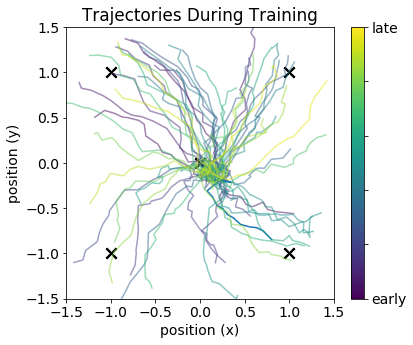

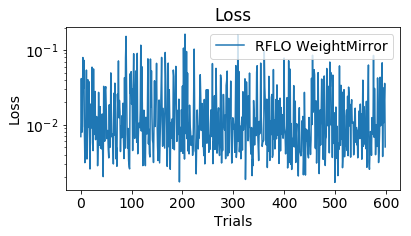

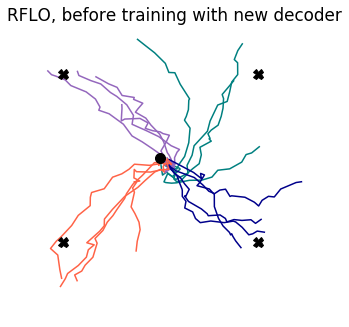

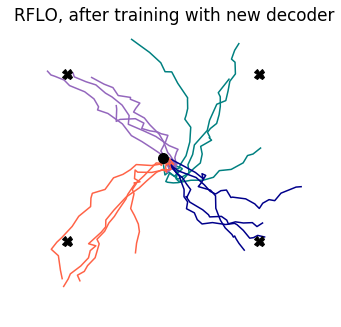

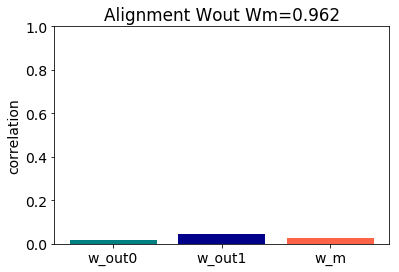

11it [00:00, 106.98it/s]

start 2000 end 2800 


200it [00:01, 124.53it/s]
8it [00:00, 79.08it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 85.22it/s]
200it [00:01, 124.62it/s]


AR early fit 0.959, late fit 0.960


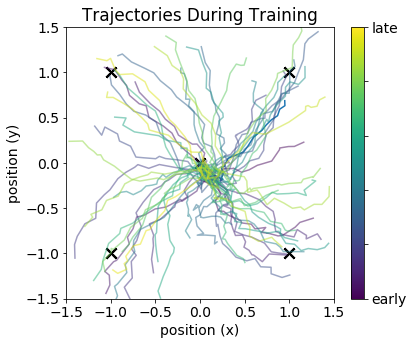

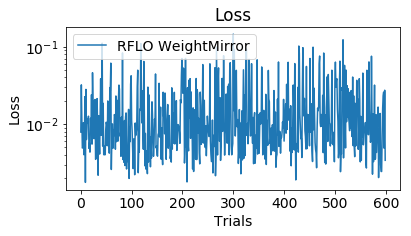

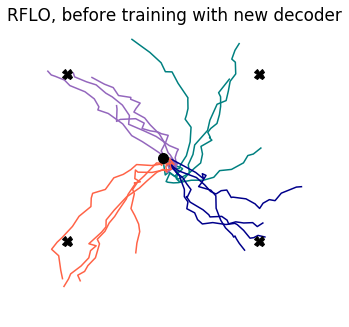

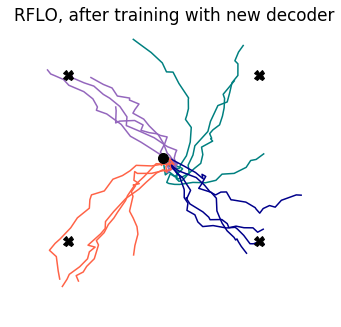

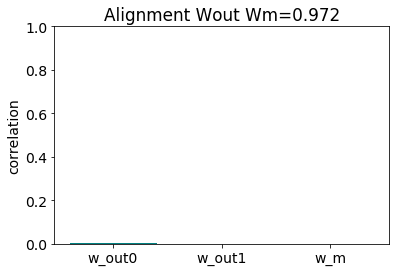

24it [00:00, 114.39it/s]

start 2200 end 3000 


200it [00:01, 124.88it/s]
8it [00:00, 77.90it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 92.25it/s]
200it [00:01, 123.72it/s]


AR early fit 0.960, late fit 0.961


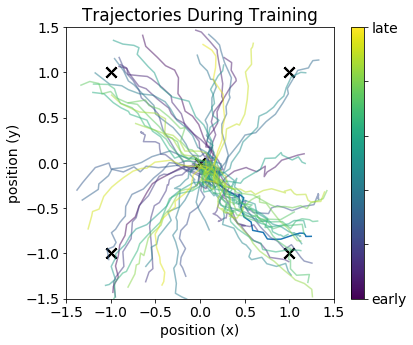

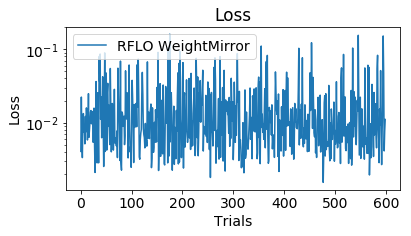

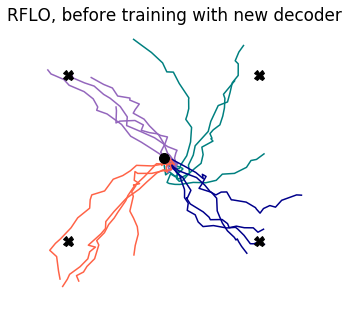

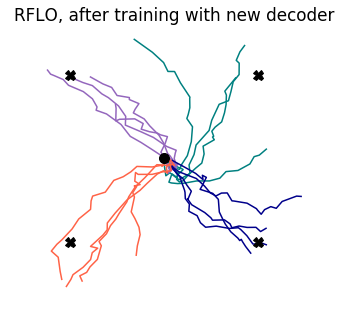

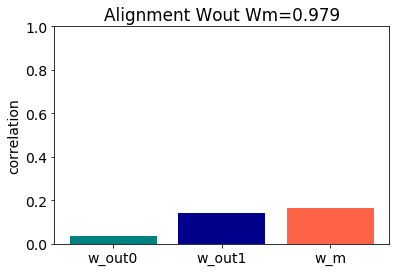

12it [00:00, 117.98it/s]

start 2400 end 3200 


200it [00:01, 123.32it/s]
8it [00:00, 75.88it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 92.68it/s]
200it [00:01, 122.12it/s]


AR early fit 0.961, late fit 0.961


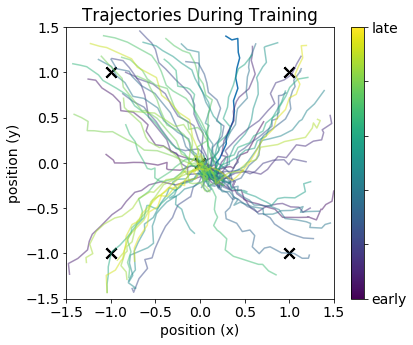

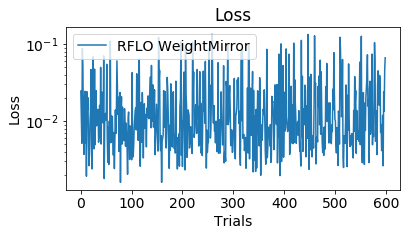

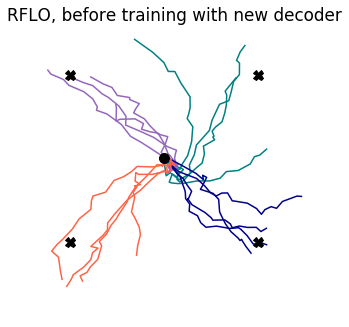

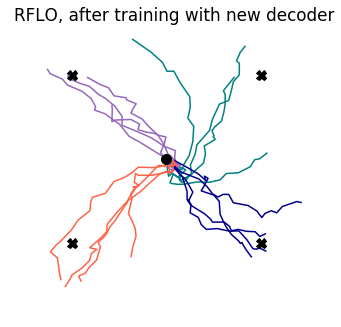

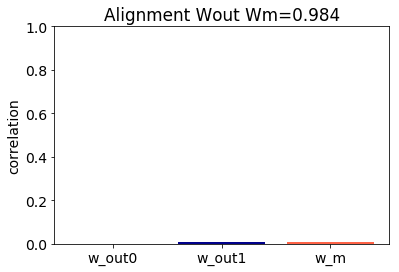

11it [00:00, 108.88it/s]

start 2600 end 3400 


200it [00:01, 122.43it/s]
6it [00:00, 45.96it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 81.10it/s]
200it [00:01, 124.29it/s]


AR early fit 0.961, late fit 0.962


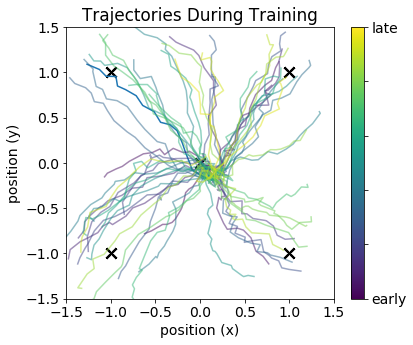

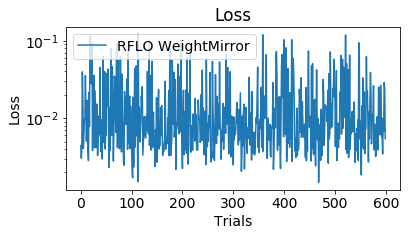

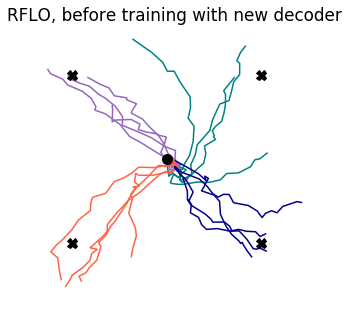

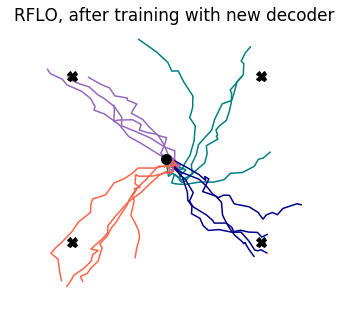

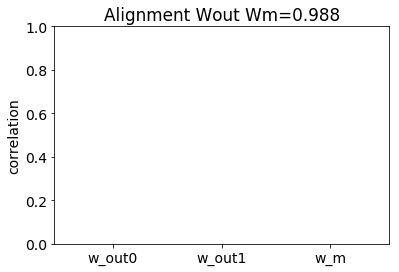

12it [00:00, 118.50it/s]

start 2800 end 3600 


200it [00:01, 126.43it/s]
8it [00:00, 76.96it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 92.78it/s]
200it [00:01, 123.35it/s]


AR early fit 0.962, late fit 0.963


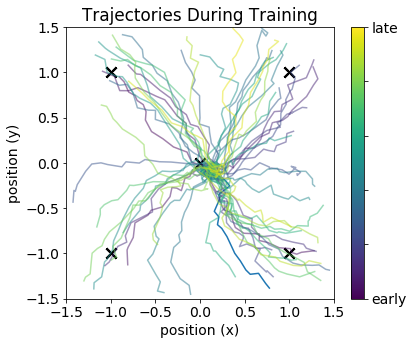

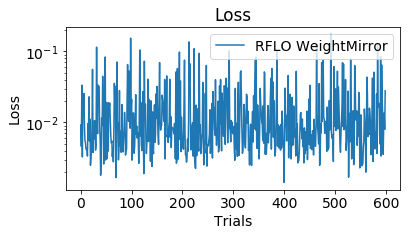

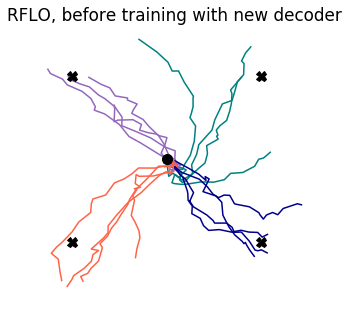

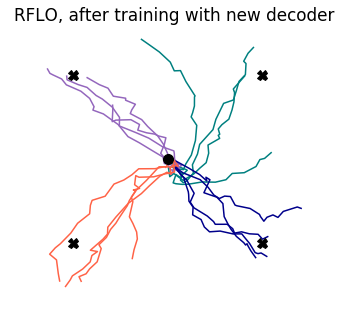

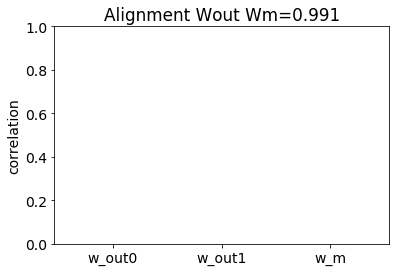

10it [00:00, 97.53it/s]

start 3000 end 3800 


200it [00:01, 122.82it/s]
1it [00:00,  8.95it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 87.17it/s]
200it [00:01, 124.51it/s]


AR early fit 0.963, late fit 0.963


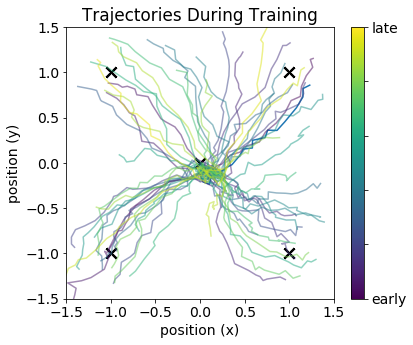

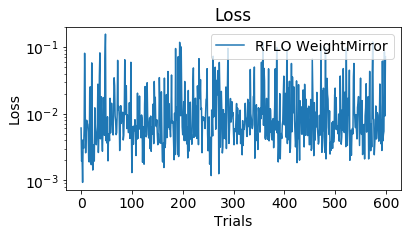

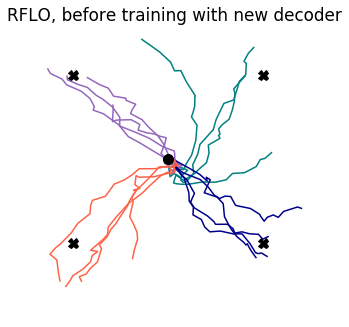

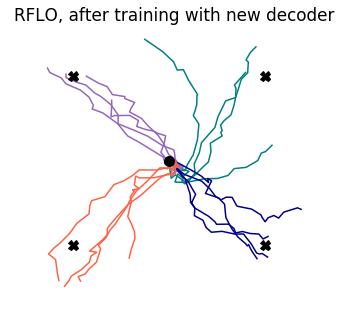

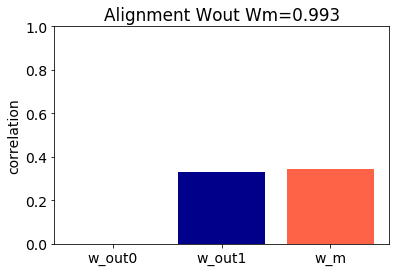

4it [00:00, 39.73it/s]

start 3200 end 4000 


200it [00:07, 26.11it/s]
6it [00:00, 55.02it/s]

>>APPLY WEIGHT MIRRORING


600it [00:12, 46.40it/s]
200it [00:02, 79.54it/s]


AR early fit 0.963, late fit 0.964


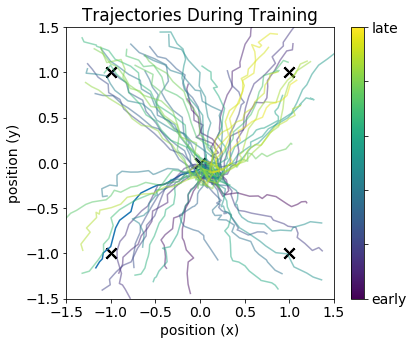

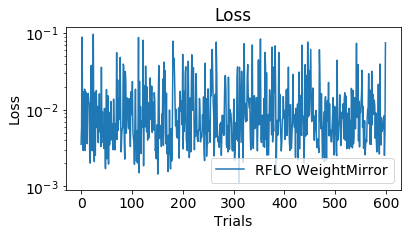

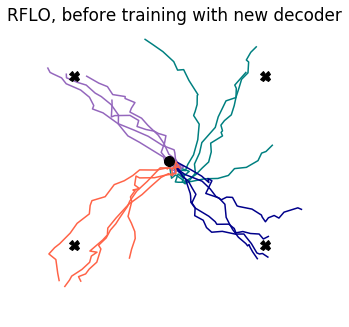

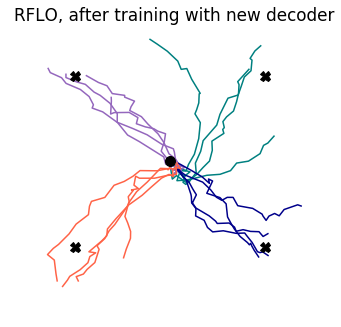

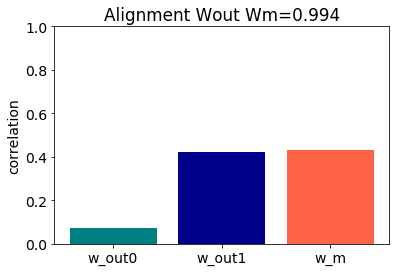

11it [00:00, 109.94it/s]

start 3400 end 4200 


200it [00:01, 106.51it/s]
7it [00:00, 64.77it/s]

>>APPLY WEIGHT MIRRORING


600it [00:10, 57.19it/s]
200it [00:01, 104.55it/s]


AR early fit 0.964, late fit 0.965


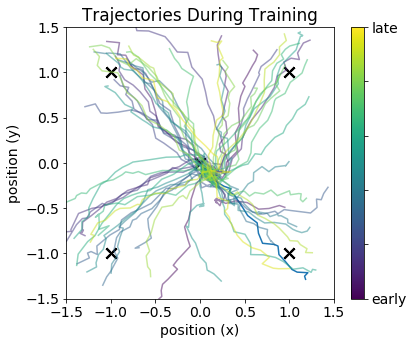

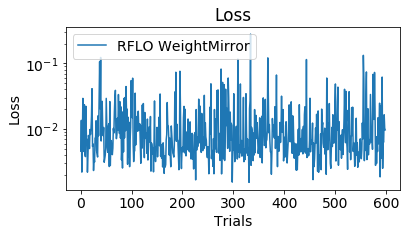

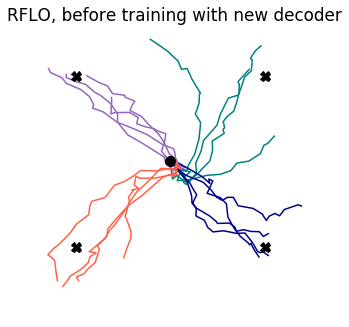

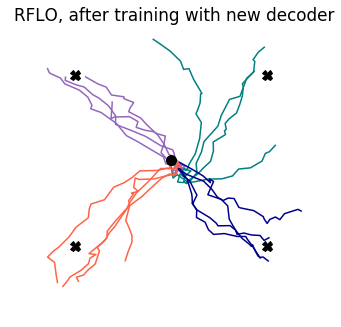

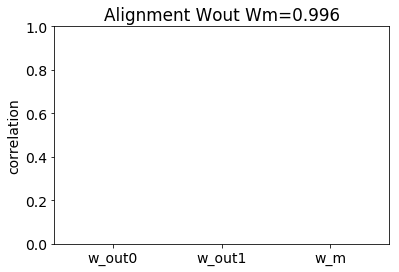

7it [00:00, 69.55it/s]

start 3600 end 4400 


200it [00:02, 89.45it/s] 
8it [00:00, 74.48it/s]

>>APPLY WEIGHT MIRRORING


600it [00:09, 65.77it/s]
200it [00:02, 98.63it/s]


AR early fit 0.965, late fit 0.965


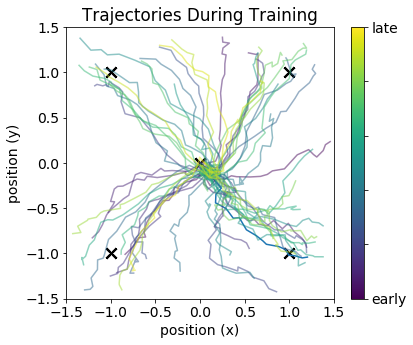

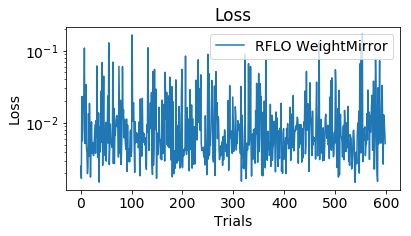

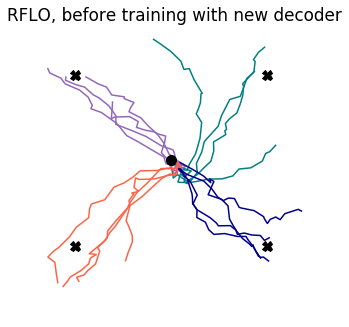

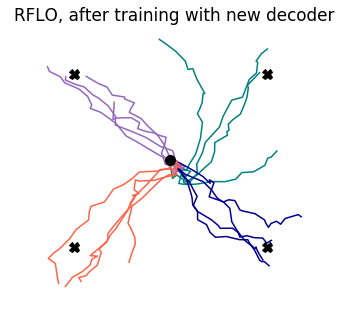

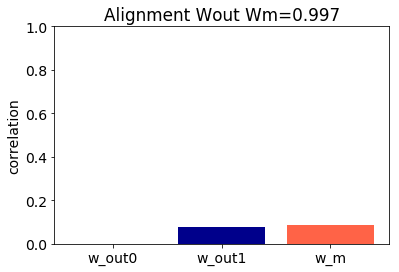

11it [00:00, 102.99it/s]

start 3800 end 4600 


200it [00:01, 114.80it/s]
7it [00:00, 65.45it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 78.81it/s]
200it [00:02, 92.62it/s]


AR early fit 0.965, late fit 0.966


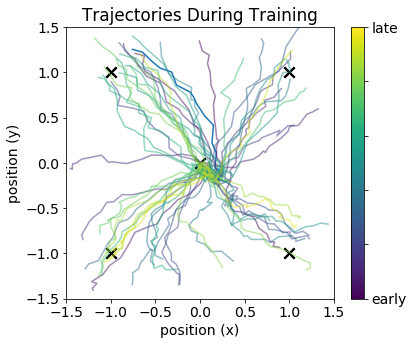

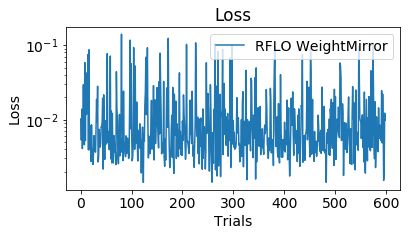

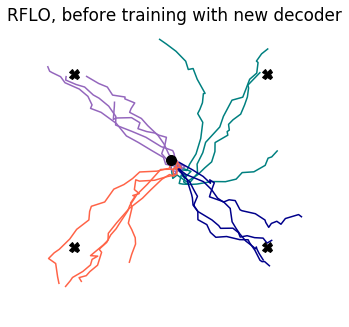

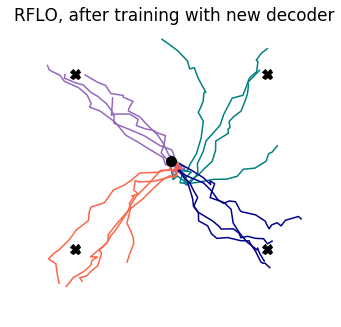

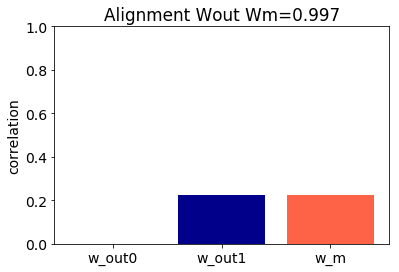

8it [00:00, 76.75it/s]

start 4000 end 4800 
M norm: 1.14	 M angle: 0.40, 4 iterations
w_out1 norm: 1.59	 w_out vs. w_out1 angle: 0.40
w_m norm: 1.14	 w_out1 vs. w_m angle: 0.40
w_m norm: 1.76	 w_out vs. w_m angle: 0.18start 0 end 800 


200it [00:01, 108.63it/s]
7it [00:00, 62.18it/s]

>>APPLY WEIGHT MIRRORING


600it [00:08, 71.83it/s]
200it [00:01, 106.78it/s]


AR early fit 0.920, late fit 0.924


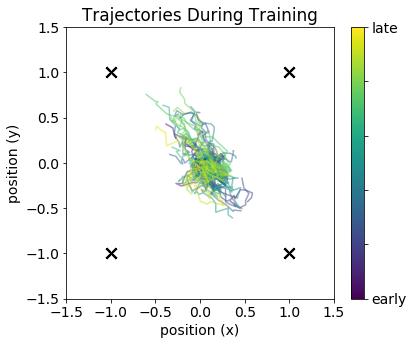

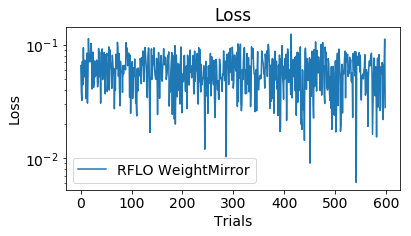

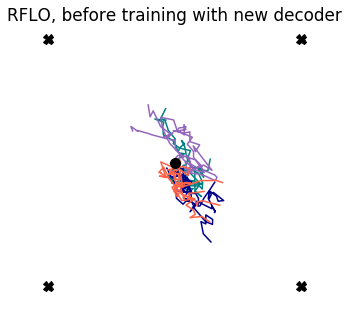

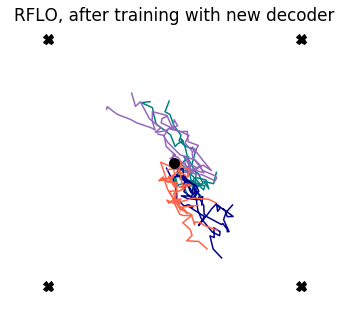

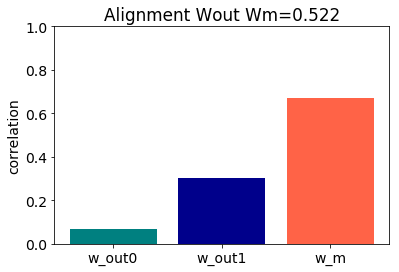

9it [00:00, 84.03it/s]

start 200 end 1000 


200it [00:01, 105.48it/s]
7it [00:00, 64.65it/s]

>>APPLY WEIGHT MIRRORING


600it [00:08, 69.30it/s]
200it [00:02, 70.72it/s]


AR early fit 0.924, late fit 0.931


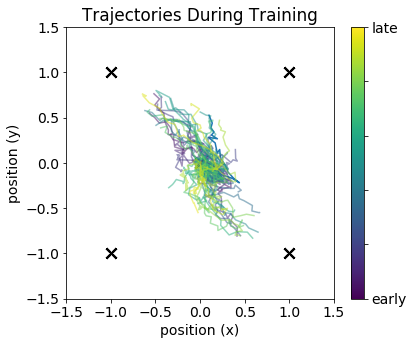

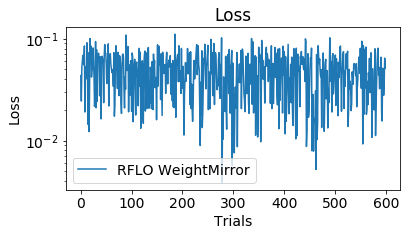

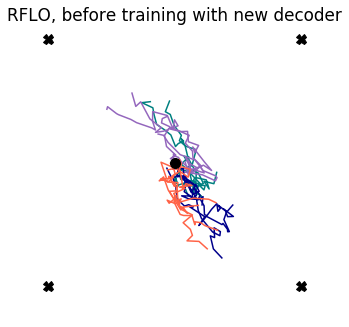

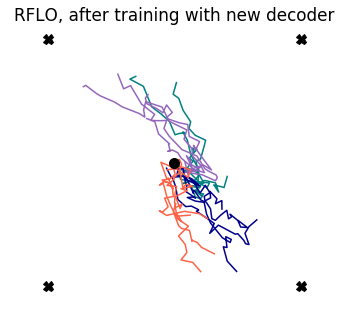

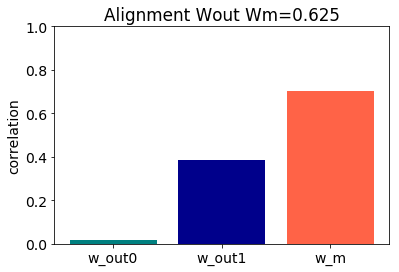

10it [00:00, 94.97it/s]

start 400 end 1200 


200it [00:01, 108.32it/s]
8it [00:00, 77.57it/s]

>>APPLY WEIGHT MIRRORING


600it [00:08, 71.91it/s]
200it [00:02, 94.86it/s]


AR early fit 0.931, late fit 0.937


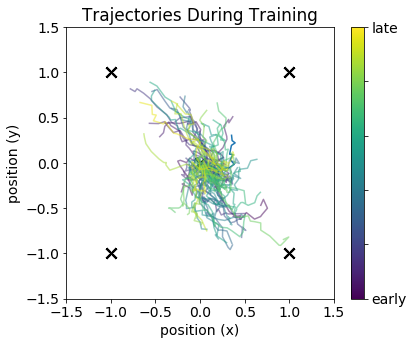

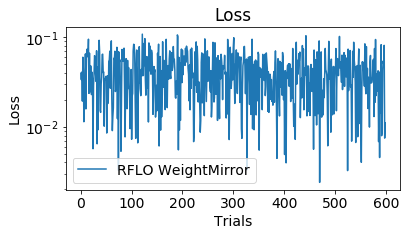

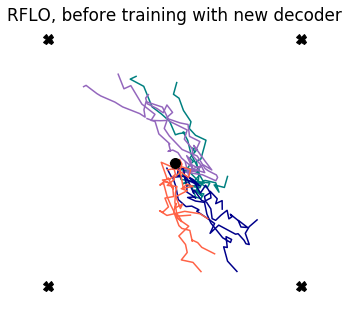

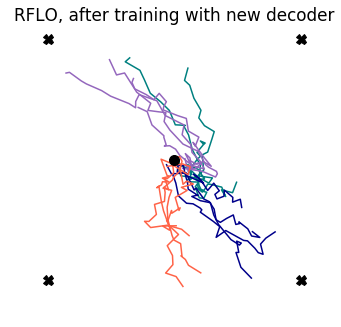

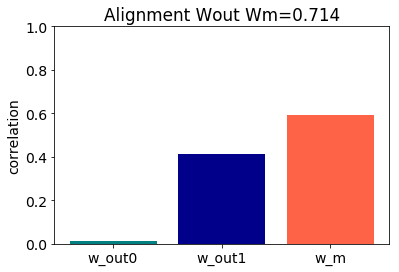

10it [00:00, 94.58it/s]

start 600 end 1400 


200it [00:02, 96.69it/s]
6it [00:00, 58.69it/s]

>>APPLY WEIGHT MIRRORING


600it [00:08, 67.93it/s]
200it [00:02, 64.66it/s]


AR early fit 0.937, late fit 0.943


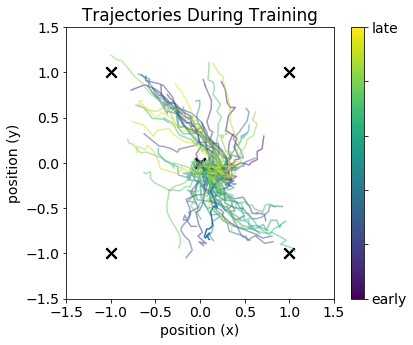

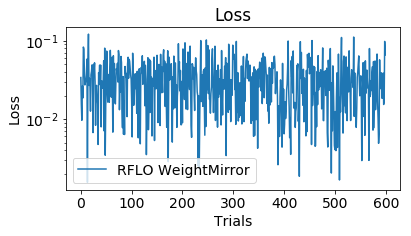

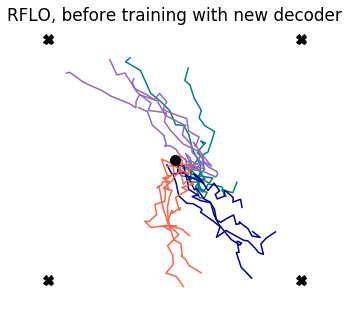

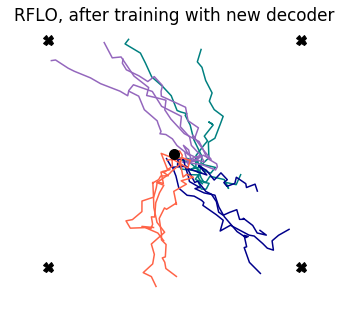

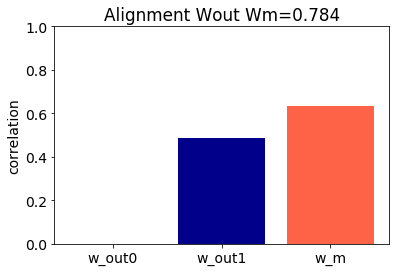

11it [00:00, 103.43it/s]

start 800 end 1600 


200it [00:02, 70.36it/s]
1it [00:00,  5.53it/s]

>>APPLY WEIGHT MIRRORING


600it [00:09, 63.48it/s]
200it [00:02, 100.87it/s]


AR early fit 0.943, late fit 0.947


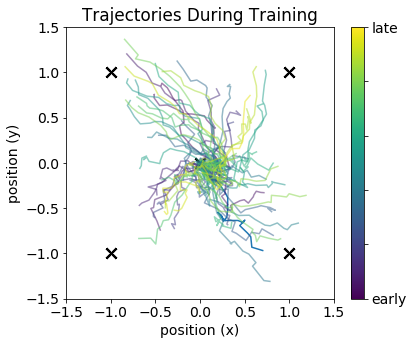

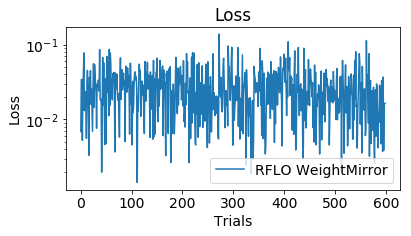

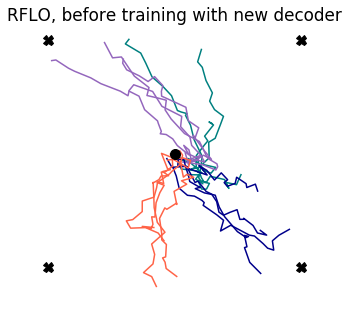

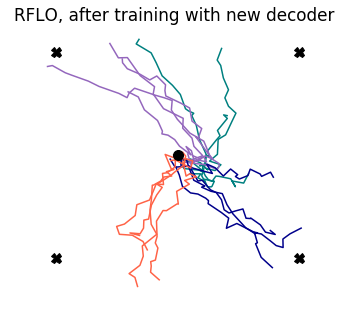

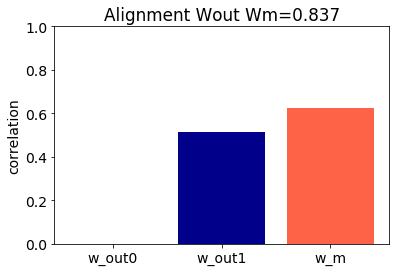

12it [00:00, 116.22it/s]

start 1000 end 1800 


200it [00:02, 89.73it/s]
6it [00:00, 54.91it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 75.15it/s]
200it [00:02, 91.96it/s] 


AR early fit 0.947, late fit 0.951


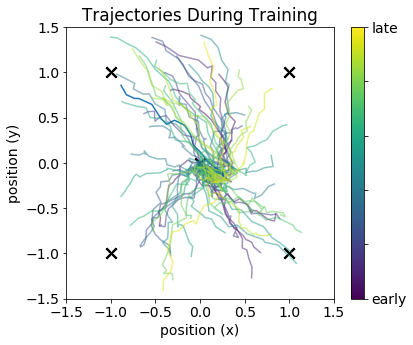

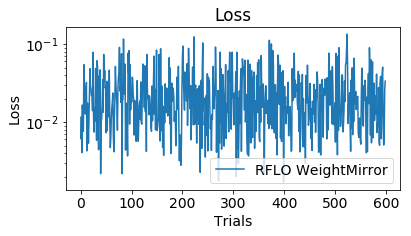

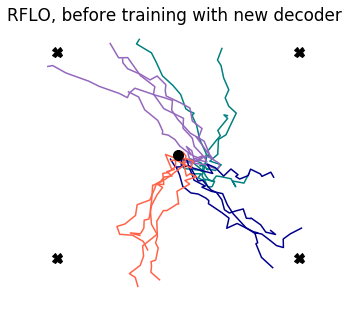

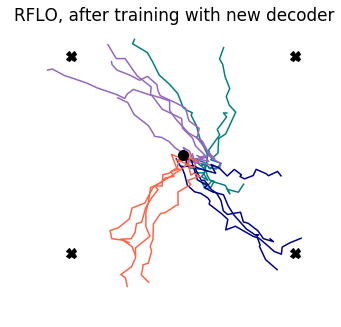

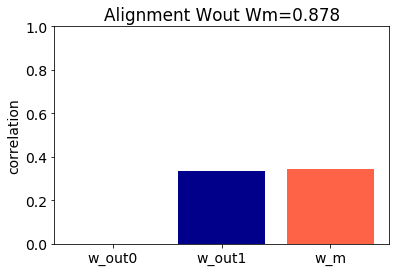

12it [00:00, 114.70it/s]

start 1200 end 2000 


200it [00:02, 92.75it/s]
1it [00:00,  8.22it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 81.73it/s]
200it [00:01, 102.86it/s]


AR early fit 0.951, late fit 0.953


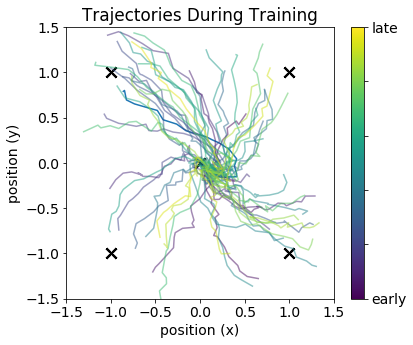

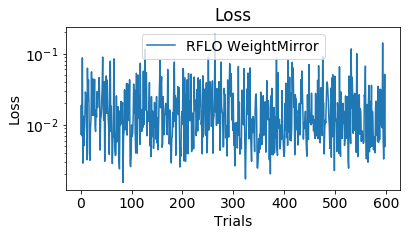

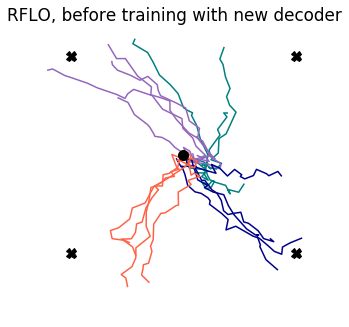

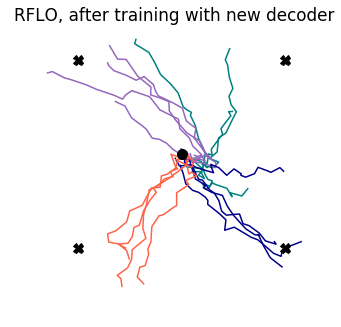

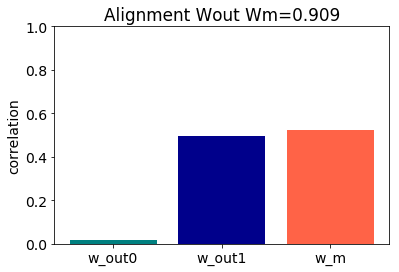

13it [00:00, 122.75it/s]

start 1400 end 2200 


200it [00:01, 122.86it/s]
7it [00:00, 68.65it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 91.68it/s]
200it [00:01, 123.48it/s]


AR early fit 0.953, late fit 0.956


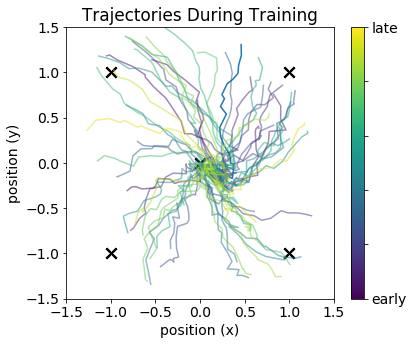

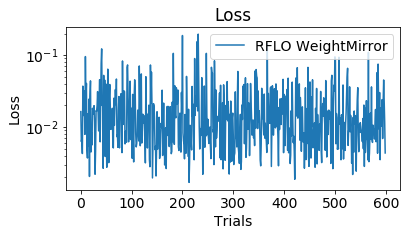

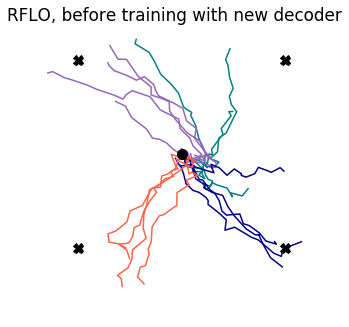

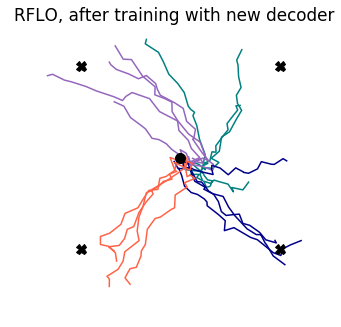

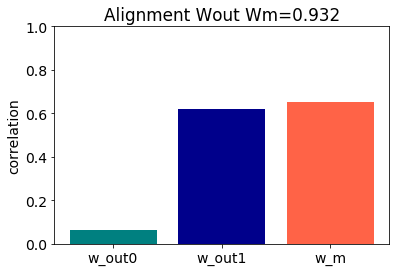

11it [00:00, 105.88it/s]

start 1600 end 2400 


200it [00:01, 121.59it/s]
8it [00:00, 77.51it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 91.28it/s]
200it [00:01, 123.52it/s]


AR early fit 0.956, late fit 0.957


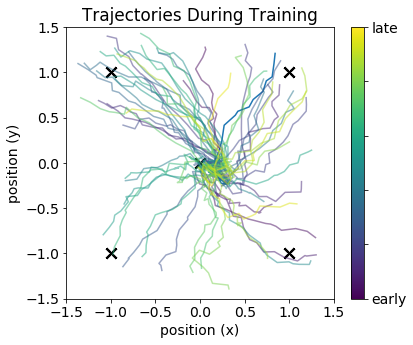

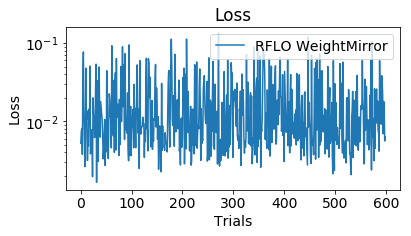

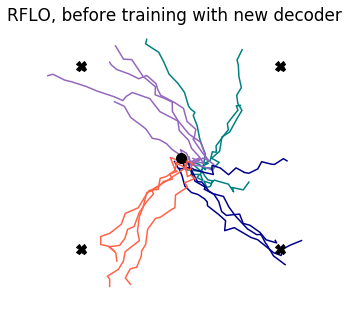

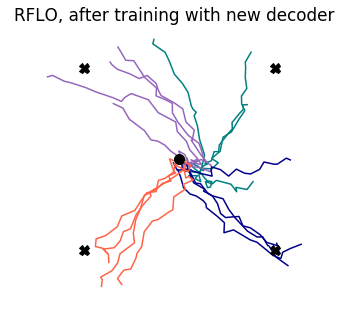

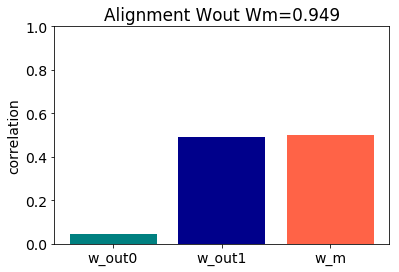

11it [00:00, 107.19it/s]

start 1800 end 2600 


200it [00:01, 120.88it/s]
8it [00:00, 71.64it/s]

>>APPLY WEIGHT MIRRORING


600it [00:08, 80.19it/s]
200it [00:01, 105.73it/s]


AR early fit 0.957, late fit 0.959


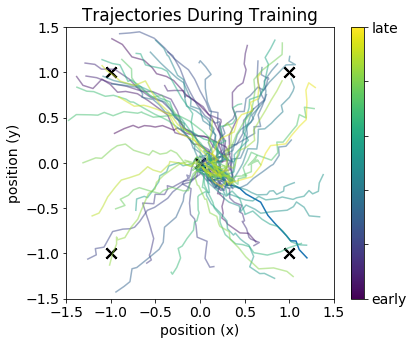

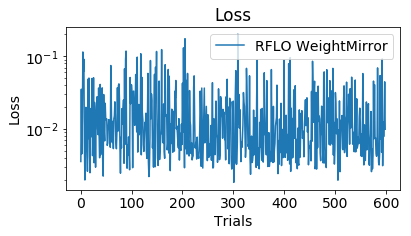

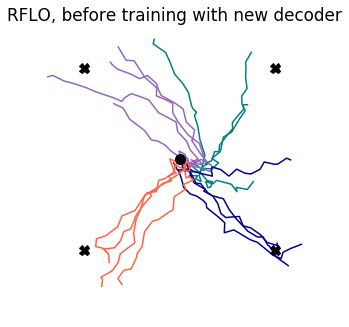

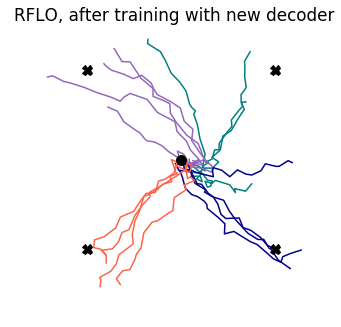

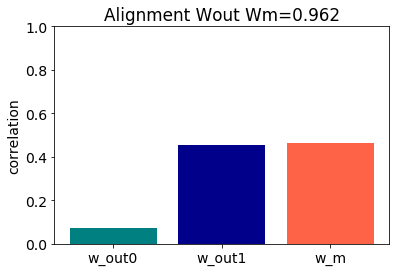

9it [00:00, 86.88it/s]

start 2000 end 2800 


200it [00:01, 103.51it/s]
6it [00:00, 59.35it/s]

>>APPLY WEIGHT MIRRORING


600it [00:07, 79.41it/s]
200it [00:01, 107.82it/s]


AR early fit 0.959, late fit 0.960


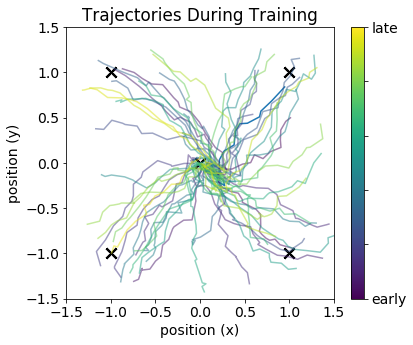

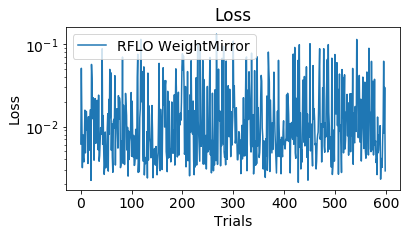

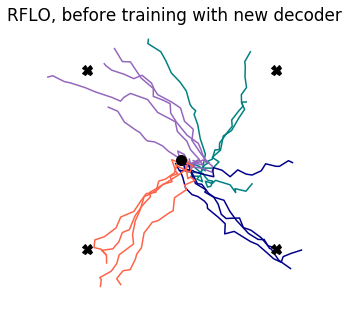

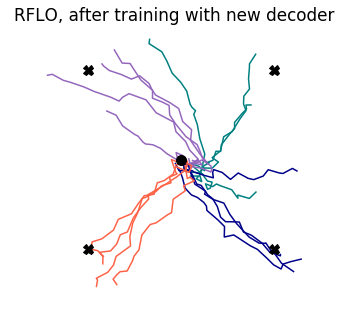

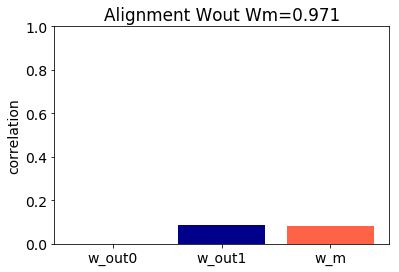

10it [00:00, 92.91it/s]

start 2200 end 3000 


200it [00:01, 115.62it/s]
8it [00:00, 74.40it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 87.46it/s]
200it [00:01, 123.54it/s]


AR early fit 0.960, late fit 0.960


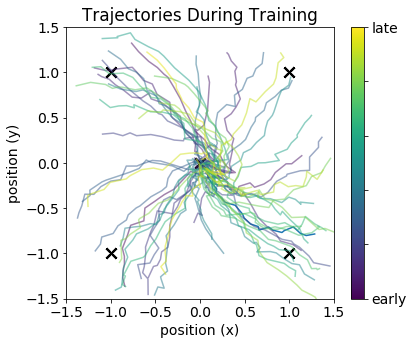

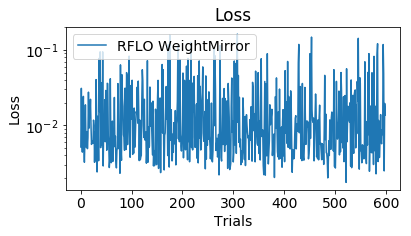

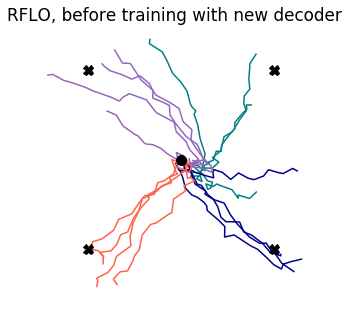

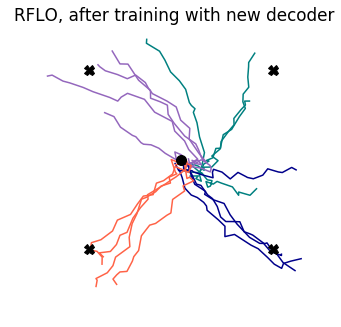

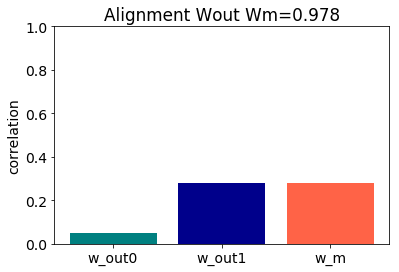

9it [00:00, 89.35it/s]

start 2400 end 3200 


200it [00:01, 110.69it/s]
8it [00:00, 76.93it/s]

>>APPLY WEIGHT MIRRORING


600it [00:09, 61.32it/s]
200it [00:02, 90.94it/s]


AR early fit 0.960, late fit 0.961


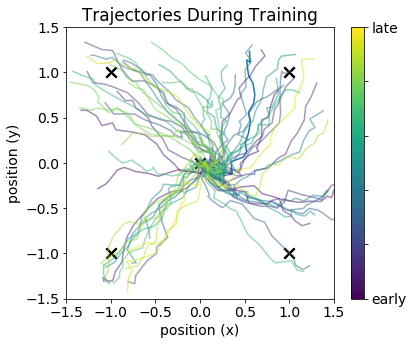

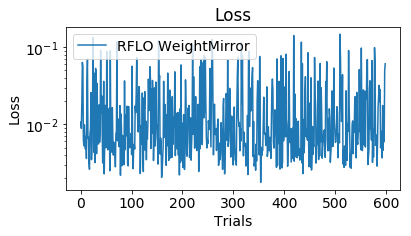

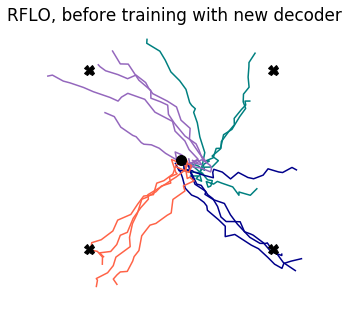

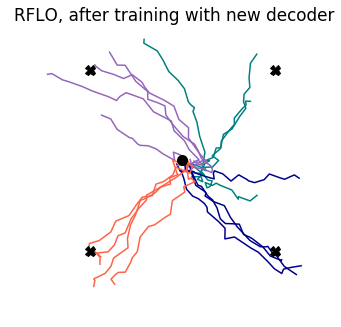

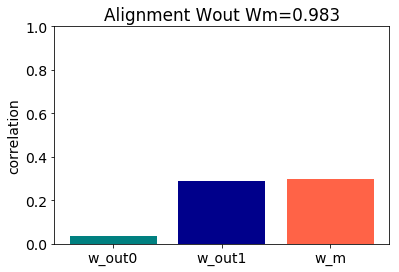

13it [00:00, 117.32it/s]

start 2600 end 3400 


200it [00:01, 107.36it/s]
7it [00:00, 64.27it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 88.76it/s]
200it [00:01, 129.41it/s]


AR early fit 0.961, late fit 0.962


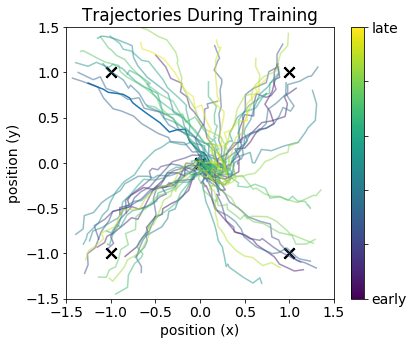

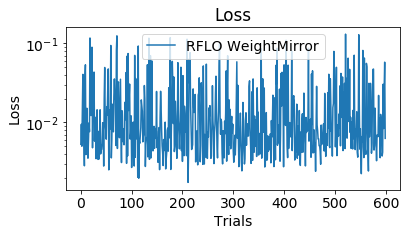

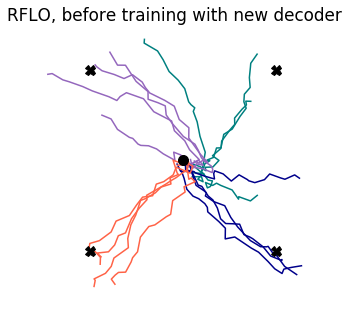

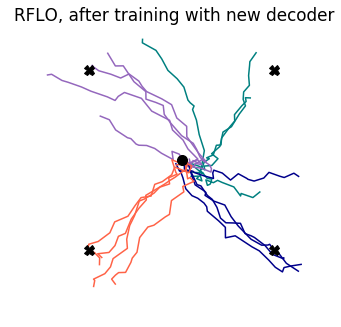

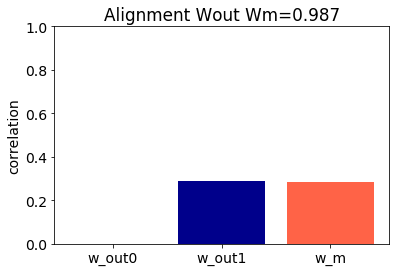

14it [00:00, 131.26it/s]

start 2800 end 3600 


200it [00:01, 129.90it/s]
8it [00:00, 78.14it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 91.98it/s]
200it [00:01, 130.49it/s]


AR early fit 0.962, late fit 0.962


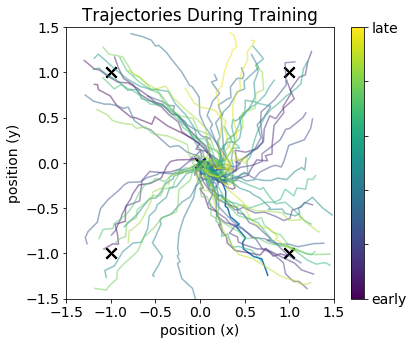

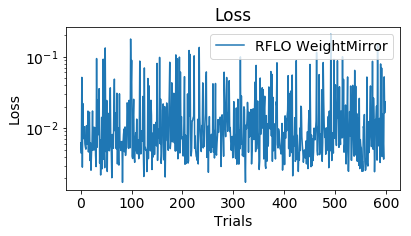

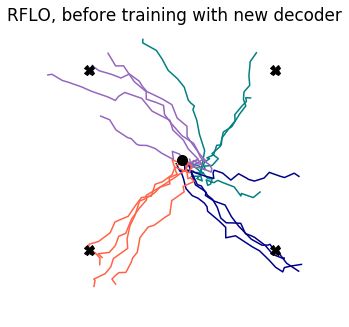

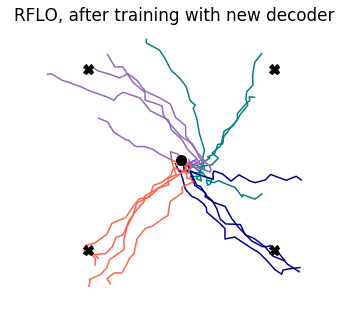

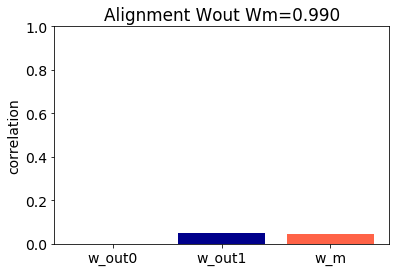

13it [00:00, 127.85it/s]

start 3000 end 3800 


200it [00:01, 119.12it/s]
6it [00:00, 55.20it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 93.04it/s]
200it [00:01, 130.32it/s]


AR early fit 0.962, late fit 0.963


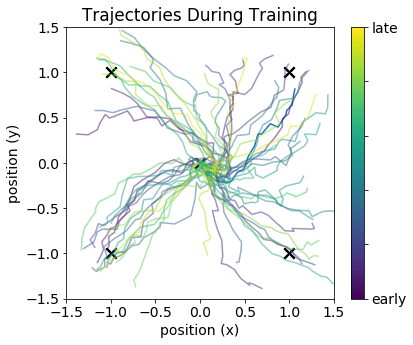

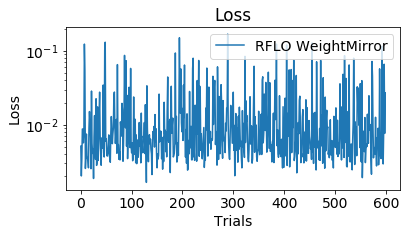

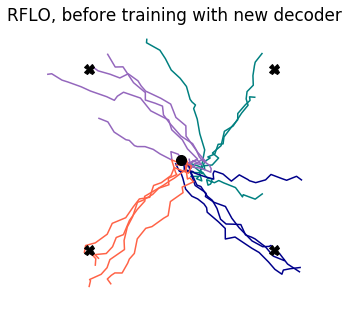

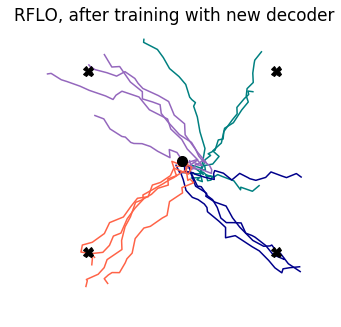

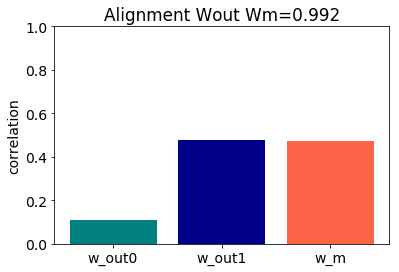

14it [00:00, 131.61it/s]

start 3200 end 4000 


200it [00:01, 130.37it/s]
9it [00:00, 89.23it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 87.01it/s]
200it [00:01, 129.22it/s]


AR early fit 0.963, late fit 0.964


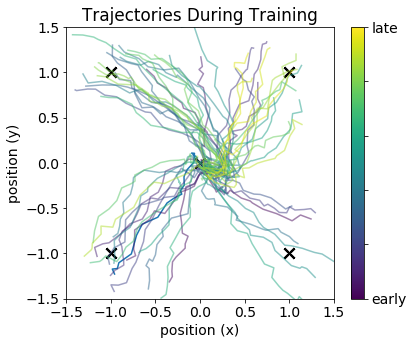

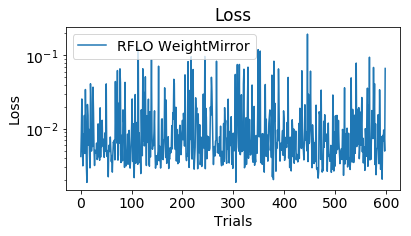

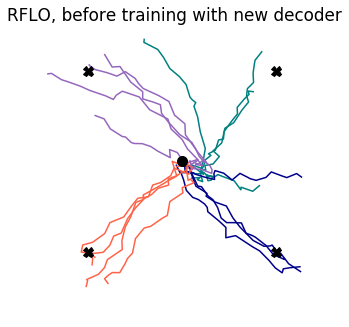

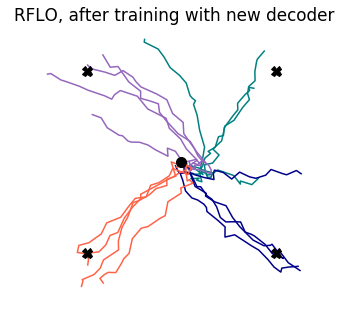

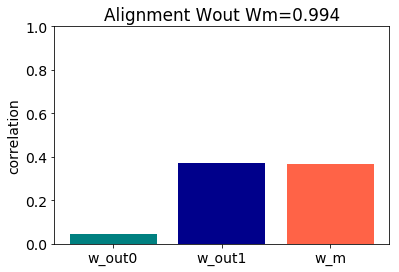

10it [00:00, 91.21it/s]

start 3400 end 4200 


200it [00:01, 119.74it/s]
2it [00:00, 19.65it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 93.16it/s]
200it [00:01, 129.42it/s]


AR early fit 0.964, late fit 0.964


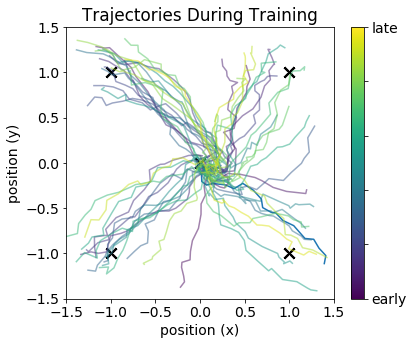

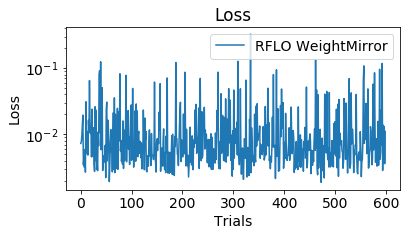

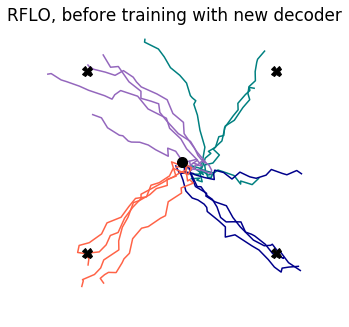

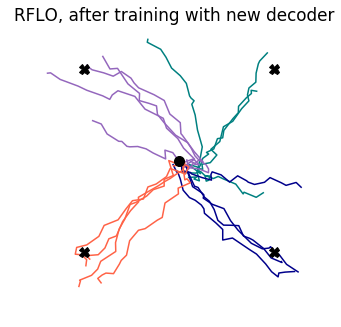

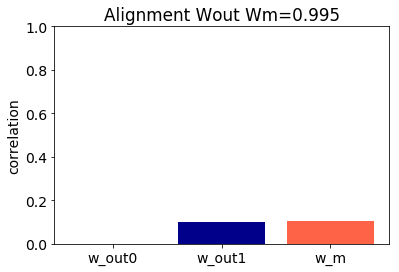

14it [00:00, 131.46it/s]

start 3600 end 4400 


200it [00:01, 129.88it/s]
9it [00:00, 83.33it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 95.03it/s]
200it [00:01, 126.40it/s]


AR early fit 0.964, late fit 0.965


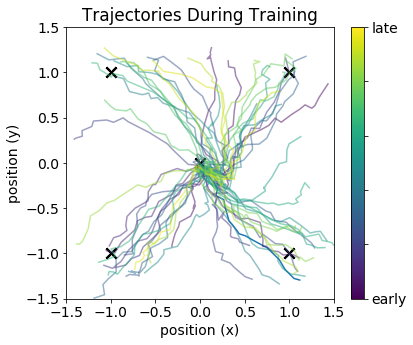

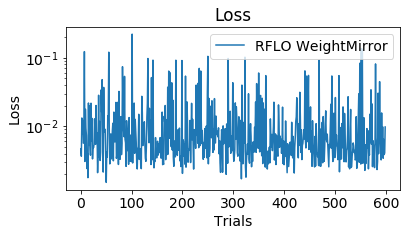

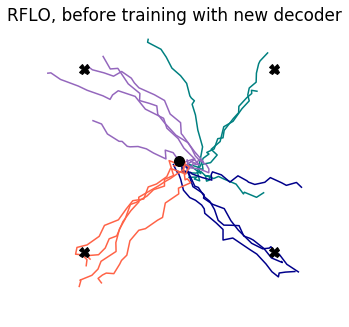

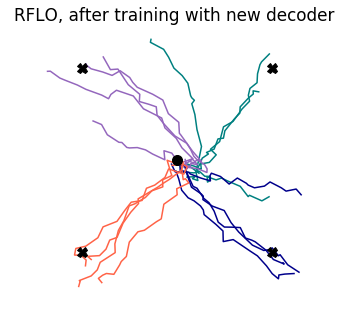

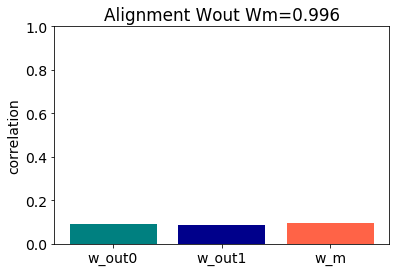

14it [00:00, 132.19it/s]

start 3800 end 4600 


200it [00:01, 129.31it/s]
9it [00:00, 86.80it/s]

>>APPLY WEIGHT MIRRORING


600it [00:06, 95.80it/s]
200it [00:01, 130.54it/s]


AR early fit 0.965, late fit 0.965


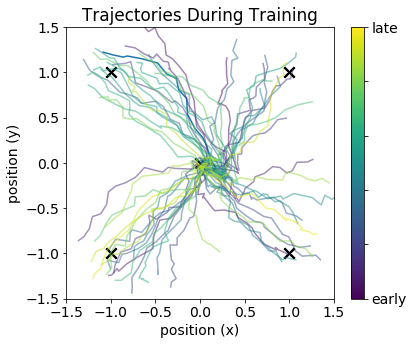

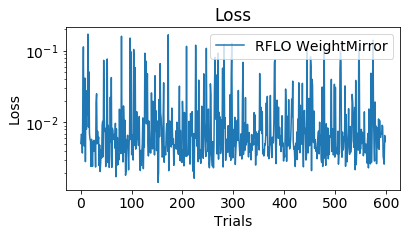

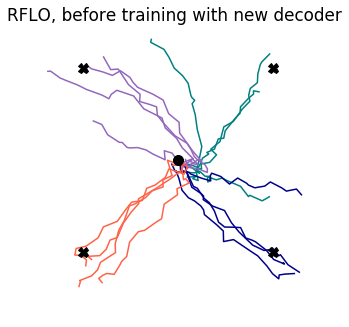

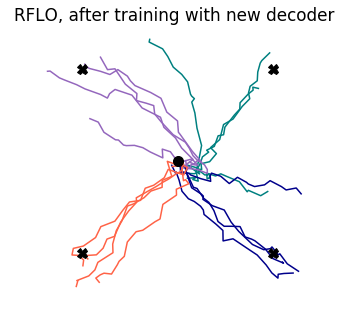

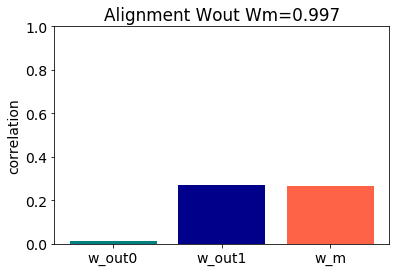

start 4000 end 4800 


In [22]:
# Set RNN Parameters
params = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.05,eta_out=0.1,eta_m=0.001,
               sig_in=0.0,sig_rec=0.25,sig_out=0.01,sig_m = 0.1, lam_m = 0.00001,
               velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
               rng=np.random.RandomState(72))
params.print_params()

# Initialize RNN
net0 = RNN(params)
sim0 = Simulation(net0)
rflo = RFLO(net0,apply_to=['w_rec'],online=False)
sim0.run_session(n_trials=2500, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=20)

fig0 = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4],title='Pretrain RFLO, train '+r'$W_{rec}$')






""" Average over multiple seeds """
seeds = [1,5,7,12]#,54,72,81]
overlaps = [0.4]
n_changes = [75]



stats = {}
stats['corr1'] = []
stats['corr2'] = []
stats['corr3'] = []
stats['corrcoef'] = []

stats['corr_w_m'] = []

for seed in seeds:

    corr1_list = []
    corr2_list = []
    corr3_list = []
    corrcoef_list = []
    
    corr_w_m = []

    for overlap,n_change in zip(overlaps,n_changes):
        
        w_out1 = choose_aligned_matrix(net0.w_out.copy(),n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)
        w_m = choose_aligned_matrix(w_out1,n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)

        # confirm overlap between w_out1 and w_out
        norm, angle = return_norm_and_angle(net0.w_out,w_out1)
        print('\nw_out1 norm: {:.2f}'.format(norm) + '\t w_out vs. w_out1 angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out1 and w_m
        norm, angle = return_norm_and_angle(w_out1,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out1 vs. w_m angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out and w_m
        norm, angle = return_norm_and_angle(net0.w_out,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out vs. w_m angle: {:.2f}'.format(angle),end='')
        
        
        
        
        

        # unfortunately I need to make a different network to maintain integrity of pre and post simulations for plotting
        net1 = RNN(params)
        net1.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net1.set_weights(w_out = w_out1)
        net1.set_weights(w_m = w_m.T)




        """ Track activity with new decoder, before training """
        """ Calculate F fields Over windows """
        window = 200
        delta = 600
        blocks = np.arange(0,5000,window)
        
        for start in blocks:
            end = start + delta + window
            print('start {} end {} '.format(start,end))
            if end+window > np.max(blocks):
                break
                
                
            net1_pre = RNN(params)
            net1_pre.set_weights(w_in=net0.w_in.copy(), w_rec=net1.w_rec.copy())
            net1_pre.set_weights(w_out = w_out1)
            net1_pre.set_weights(w_m = net1.w_m.copy()) # make sure this is updated!

            sim1_pre = Simulation(net1_pre)
            trackvars = TrackVars(net1_pre,apply_to=[]) 
            sim1_pre.run_session(n_trials=window, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)
            #fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

            """ Train with new decoder """

            sim1_train = Simulation(net1)
            rflo = RFLO(net1,apply_to=['w_rec'],online=False)
            weight_mirror = WeightMirror(net1,apply_to=['w_m']) 
            print('>>APPLY WEIGHT MIRRORING')
            sim1_train.run_session(n_trials=delta, tasks=[task1,task2,task3,task4], learn_alg=[rflo,weight_mirror], probe_types=['h','loss','err'], plot=True, plot_freq=10)

            """ Track activity with new decoder, after training """
            net1_post = RNN(params)
            net1_post.set_weights(w_in=net1.w_in.copy(), w_rec=net1.w_rec.copy())
            net1_post.set_weights(w_out = net1.w_out.copy())
            net1_post.set_weights(w_m = net1.w_m.copy())

            sim1_post = Simulation(net1_post)
            trackvars = TrackVars(net1_post,apply_to=[]) 
            sim1_post.run_session(n_trials=window, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)
            
            fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

            fig = plot_trained_trajectories(sim=sim1_post, tasks=[task1,task2,task3,task4],title='RFLO, after training with new decoder')

        
        
            F_early, score_early = flow_field_data(sim1_pre.session_probes['h'])
            F_late, score_late = flow_field_data(sim1_post.session_probes['h'])

            print('AR early fit {:.3f}, late fit {:.3f}'.format(score_early,score_late))

            Fdata = F_late - F_early

            # separate train and test data from sim1_train
            n_total = len(sim1_train.session_probes['h'])
            n_train = int(0.5 * n_total)
            idx_train = np.random.RandomState(1975+seed).choice(np.arange(0,n_total),size=n_train,replace=False).astype(int)
            idx_test = np.arange(0,n_total)[~idx_train].astype(int)
            #idx_test=idx_train

            h_train = np.asarray(sim1_train.session_probes['h'])[idx_train,:,:,:]
            err_train = np.asarray(sim1_train.session_probes['err'])[idx_train,:,:,:]

            Fpred_w_out = flow_field_predicted(net0.w_out,err_train,h_train)
            Fpred_w_out1 = flow_field_predicted(w_out1,err_train,h_train)
            Fpred_w_m = flow_field_predicted(net1.w_m.T,err_train,h_train)

            h_test = np.asarray(sim1_train.session_probes['h'])[idx_test,:,:,:]

            corr1 = calculate_flow_field_correlation(Fpred_w_out,Fdata,h_test) # could also sample sim_test
            corr1_list.append(corr1)

            corr2 = calculate_flow_field_correlation(Fpred_w_out1,Fdata,h_test) # could also sample sim_test
            corr2_list.append(corr2)

            corr3 = calculate_flow_field_correlation(Fpred_w_m,Fdata,h_test) # could also sample sim_test
            corr3_list.append(corr3)
            
            
            """ keep tack of alignment """
            
            corr_w_m.append(np.corrcoef(net1.w_m.copy().T.ravel(),net1.w_out.copy().ravel())[0,1])

            fig,ax = plt.subplots(1,1)
            plt.bar([0,1,2],[corr1,corr2,corr3],tick_label=['w_out0','w_out1','w_m'],color=['teal','darkblue','tomato'])
            plt.ylim([0,1])
            plt.ylabel('correlation')
            plt.title('Alignment Wout Wm={:.3f}'.format(corr_w_m[-1]))
            plt.show()
        

        
    # update
    stats['corr1'].append(corr1_list)
    stats['corr2'].append(corr2_list)
    stats['corr3'].append(corr3_list)
    
    stats['corr_w_m'].append(corr_w_m)



In [24]:
#stats_rflo_weightmirror = stats
""" save dict with unique name """
stats_rflo_weightmirror = stats

save = False
tag = '5-19-v1'

if save:
    
    with open(folder+'stats_rflo_weightmirror'+tag+'.pickle', 'wb') as handle:
        pickle.dump(stats_rflo_weightmirror, handle, protocol=pickle.HIGHEST_PROTOCOL)


In [9]:
""" load """
import pickle
filename='../NeurIPS-2022-5-16/figs-2022-5-19/'+'stats_rflo_weightmirror5-19-v1.pickle'
#I think I accidentally overwrote it =/

with open(filename, 'rb') as fp:
    stats = pickle.load(fp)

In [13]:
""" blocks defined above """
window = 200
delta = 600
blocks = np.arange(0,5000,window)

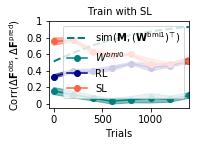

In [24]:
save = True
paper = True

ind = np.where(blocks < blocks[-1]-window-delta)[0]
x = blocks[ind]

n_samples = len(stats['corr1'])
mn1 = np.mean(np.asarray(stats['corr1']).T,axis=1)
mn2 = np.mean(np.asarray(stats['corr2']).T,axis=1)
mn3 = np.mean(np.asarray(stats['corr3']).T,axis=1)
std1 = np.std(np.asarray(stats['corr1']).T,axis=1)
std2 = np.std(np.asarray(stats['corr2']).T,axis=1)
std3 = np.std(np.asarray(stats['corr3']).T,axis=1)
sem1 = std1/np.sqrt(n_samples)
sem2 = std2/np.sqrt(n_samples)
sem3 = std3/np.sqrt(n_samples)

fig,ax = plt.subplots(1,1)

plt.plot(x,np.mean(np.asarray(stats['corr_w_m']).T,axis=1),'--',linewidth=2,color='teal',label='sim('+r'$\mathbf{M},(\mathbf{W}^{\mathrm{bmi1}})^\top)$')

plt.plot(x,mn1,'o-',color='teal',label=r'$W^{bmi0}$')
plt.plot(x,mn2,'o-',color='darkblue',label='RL')
plt.plot(x,mn3,'o-',color='tomato',label='SL')
plt.fill_between(x,mn1-sem1,mn1+sem1,alpha=0.5,color='teal')
plt.fill_between(x,mn2-sem2,mn2+sem2,alpha=0.5,color='darkblue')
plt.fill_between(x,mn3-sem3,mn3+sem3,alpha=0.5,color='tomato')



plt.title('Train with SL')
plt.ylabel('Corr('+r'$\Delta \mathbf{F}^{\mathrm{obs}},\Delta \mathbf{F}^{\mathrm{pred}})$')
plt.xlabel('Trials')
plt.ylim([-0.05,1.1])
plt.xlim([-50,1400])
plt.legend()

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=None,ylabels=[0,0.2,0.4,0.6,0.8,1],linewidth=2,ylim=[-0.05,1],figsize=(2.25,3))

plt.show()

if save:
    fig.savefig(folder+'rflo-weight-mirror.pdf')